# Exploratory analysis and figure generation for RadonFAN

## 1. Imports and load data

In [7]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
import sys
sys.path.append('../sc')
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import KNNImputer
import torch
from torch.utils.data import Dataset, DataLoader
import archs as models
import helpers as hf
from datapreprocesing import create_dataloaders, preprocess_data, inverse_transform, create_binary_labels
import seaborn as sns
from sklearn.neighbors import KernelDensity
import numpy as np
import matplotlib.pyplot as plt
from itertools import permutations, combinations
from scipy.stats import wasserstein_distance
import matplotlib.dates as mdates
import joblib
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.stattools import adfuller, kpss
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.signal import welch
import itertools


In [8]:
RG1 = pd.read_csv("../data/RG1.csv")
RG2 = pd.read_csv("../data/RG2.csv")
RG1_ard = pd.read_csv("../data/RArdG1.csv")
RG2_ard = pd.read_csv("../data/RArdG2.csv")


C:\Users\Lidia\AppData\Local\Temp\ipykernel_25552\3019500603.py:3: DtypeWarning: Columns (3,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  RG1_ard = pd.read_csv("../data/RArdG1.csv")
C:\Users\Lidia\AppData\Local\Temp\ipykernel_25552\3019500603.py:4: DtypeWarning: Columns (3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  RG2_ard = pd.read_csv("../data/RArdG2.csv")


## 2. Preprocess data: select only radon values for 2024. 

Eliminate na columns

In [9]:
RG1=RG1.drop(['entry_id', 'latitude', 'longitude', 'elevation', 'status'], axis=1)
RG2=RG2.drop(['entry_id','latitude', 'longitude', 'elevation', 'status'], axis=1)

Define column names

In [10]:
RG1.columns=['DateTime', 'Radon', 'Ventilador', 'Umbral', 'Umbral alerta',
            'Pendiente subida', 'Pendiente bajada', 'Peso Radon', 'Presion_indoor']
RG2.columns=['DateTime', 'Radon', 'Ventilador', 'Umbral', 'Umbral alerta',
            'Pendiente subida', 'Pendiente bajada', 'Peso Radon', 'Presion_indoor']

Sort by datetime

In [11]:
datasets = [RG1, RG2]
for i, data in enumerate(datasets):
    data['DateTime'] = pd.to_datetime(data['DateTime'], utc=True)
    datasets[i] = data.sort_values(by='DateTime')

Plot data 

In [12]:
RG1_2024 = RG1[(RG1['DateTime'].dt.year == 2024)]
RG2_2024 = RG2[(RG2['DateTime'].dt.year == 2024)]

In [13]:
start_date = pd.Timestamp("2024-01-10", tz="UTC")
end_date   = pd.Timestamp("2024-03-18", tz="UTC")


RG1_2024_IA = RG1[
    (RG1['DateTime'] >= start_date) &
    (RG1['DateTime'] <= end_date)
]

RG2_2024_IA= RG2[
    (RG2['DateTime'] >= start_date) &
    (RG2['DateTime'] <= end_date)
]

In [14]:
start_date = pd.Timestamp("2024-04-17", tz="UTC")
end_date   = pd.Timestamp("2024-06-21", tz="UTC")

RG1_2024_RS = RG1[
    (RG1['DateTime'] >= start_date) &
    (RG1['DateTime'] <= end_date)
]

RG2_2024_RS= RG2[
    (RG2['DateTime'] >= start_date) &
    (RG2['DateTime'] <= end_date)
]

In [95]:
print(len(RG1_2024_IA), len(RG2_2024_IA), len(RG1_2024_RS), len(RG2_2024_RS))

9168 9190 9324 9349


## 3. Exploratory

IA model data

Gallery 1 - Segment 1: >100 = 51.7%
Gallery 1 - Segment 2: >100 = 52.4%
Gallery 1 - Segment 3: >100 = 36.9%
Gallery 1 - Segment 4: >100 = 41.1%
Gallery 1 - Segment 5: >100 = 92.4%
Gallery 1 - Segment 6: >100 = 77.4%
Gallery 1 - Segment 7: >100 = 55.5%
Gallery 1 - Segment 8: >100 = 79.9%
Gallery 1 - Segment 9: >100 = 30.5%
Gallery 1 - Segment 10: >100 = 6.1%
Gallery 1 - Segment 11: >100 = 53.4%
Gallery 1 - Segment 12: >100 = 54.3%
Gallery 1 - Segment 13: >100 = 37.0%
Gallery 1 - Segment 14: >100 = 0.0%
Gallery 1 - Segment 15: >100 = 28.4%
Gallery 1 - Segment 16: >100 = 0.0%
Gallery 1 - Segment 17: >100 = 31.5%
Gallery 1 - Segment 18: >100 = 17.2%
Gallery 1 - Segment 19: >100 = 29.5%
Gallery 1 - Segment 20: >100 = 34.3%
Gallery 2 - Segment 1: >300 = 71.0%
Gallery 2 - Segment 2: >300 = 38.2%
Gallery 2 - Segment 3: >300 = 0.4%
Gallery 2 - Segment 4: >300 = 60.3%
Gallery 2 - Segment 5: >300 = 34.8%
Gallery 2 - Segment 6: >300 = 29.2%
Gallery 2 - Segment 7: >300 = 55.4%
Gallery 2 - Segment 8

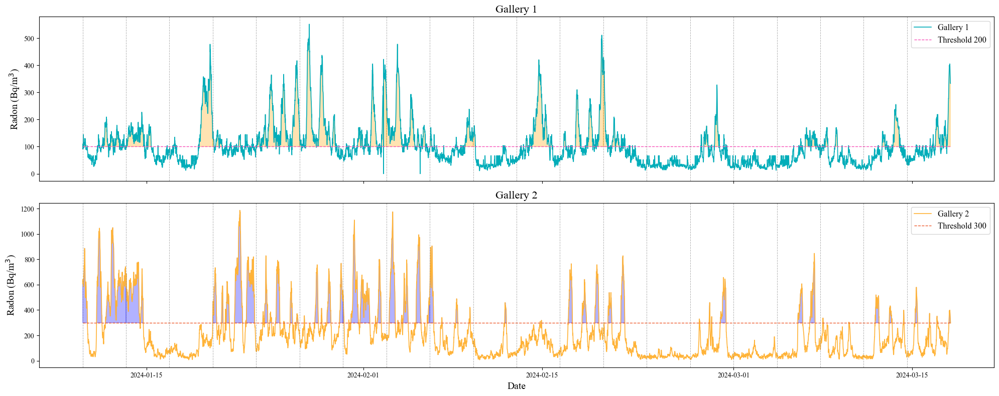

In [ ]:
plt.rcParams["font.family"] = "Times New Roman"

# Crear subplots: 2 filas, 1 columna
fig, axes = plt.subplots(2, 1, figsize=(20, 8), sharex=True)

# Definir segmentos
start = RG1_2024_IA['DateTime'].min()
end = RG1_2024_IA['DateTime'].max()
segments = pd.date_range(start=start, end=end, periods=21)  # 20 segmentos

# --- Primer subplot: Gallery 1 ---
ax = axes[0]
ax.plot(RG1_2024_IA['DateTime'], RG1_2024_IA['Radon'], linewidth=1.2, label='Gallery 1', color="#01ADB9")
ax.hlines(y=150, xmin=start, xmax=end, linewidth=1, color="#f752b8", linestyle='--', label="Threshold 200")

for i in range(20):
    seg_start = segments[i]
    seg_end = segments[i+1]
    mask = (RG1_2024_IA['DateTime'] >= seg_start) & (RG1_2024_IA['DateTime'] < seg_end)
    above = RG1_2024_IA.loc[mask, 'Radon'] > 150
    pct = above.mean() * 100
    ax.fill_between(RG1_2024_IA.loc[mask, 'DateTime'],
                    150, RG1_2024_IA.loc[mask, 'Radon'],
                    where=above, color='orange', alpha=0.3)
    print(f"Gallery 1 - Segment {i+1}: >150 = {pct:.1f}%")
    ax.axvline(x=seg_start, color="gray", linestyle="--", linewidth=0.7, alpha=0.6)

ax.set_ylabel(r"Radon (Bq/m$^3$)", fontsize=14)
ax.legend(fontsize=12)
ax.set_title("Gallery 1", fontsize=16)

# --- Segundo subplot: Gallery 2 ---
ax = axes[1]
ax.plot(RG2_2024_IA['DateTime'], RG2_2024_IA['Radon'], linewidth=1.2, label='Gallery 2', color="#ffb338")
ax.hlines(y=300, xmin=start, xmax=end, linewidth=1, color="#ee5c30", linestyle='--', label="Threshold 300")

for i in range(20):
    seg_start = segments[i]
    seg_end = segments[i+1]
    mask = (RG2_2024_IA['DateTime'] >= seg_start) & (RG2_2024_IA['DateTime'] < seg_end)
    above = RG2_2024_IA.loc[mask, 'Radon'] > 300
    pct = above.mean() * 100
    ax.fill_between(RG2_2024_IA.loc[mask, 'DateTime'],
                    300, RG2_2024_IA.loc[mask, 'Radon'],
                    where=above, color='blue', alpha=0.3)
    print(f"Gallery 2 - Segment {i+1}: >300 = {pct:.1f}%")
    ax.axvline(x=seg_start, color="gray", linestyle="--", linewidth=0.7, alpha=0.6)

ax.set_xlabel("Date", fontsize=14)
ax.set_ylabel(r"Radon (Bq/m$^3$)", fontsize=14)
ax.legend(fontsize=12)
ax.set_title("Gallery 2", fontsize=16)

plt.tight_layout()
plt.show()

RS model data

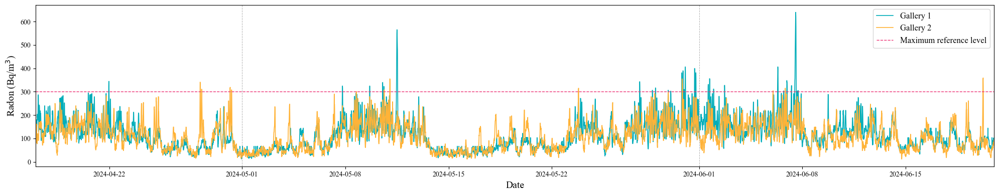

In [11]:
plt.rcParams["font.family"] = "Times New Roman"

plt.figure(figsize=(20, 4))

# plot radon signals
plt.plot(RG1_2024_RS['DateTime'], RG1_2024_RS['Radon'], linewidth=1.2, 
         label='Gallery 1', color="#01ADB9")
plt.plot(RG2_2024_RS['DateTime'], RG2_2024_RS['Radon'], linewidth=1.2, 
         label='Gallery 2', color="#ffb338")

# horizontal reference line
plt.hlines(y=300, xmin=RG1_2024_RS['DateTime'].min(), xmax=RG1_2024_RS['DateTime'].max(), 
           linewidth=1, color="#ee3073", linestyle='--', label="Maximum reference level")

# vertical lines at the beginning of each month
start = RG1_2024_RS['DateTime'].min().normalize()
end = RG1_2024_RS['DateTime'].max().normalize()
for d in pd.date_range(start=start, end=end, freq='MS'):  # 'MS' = Month Start
    plt.axvline(x=d, color="gray", linestyle="--", linewidth=0.7, alpha=0.6)

# formatting
plt.xlim([RG1_2024_RS['DateTime'].min(), RG1_2024_RS['DateTime'].max()])
plt.xlabel("Date", fontsize=14)
plt.ylabel(r"Radon (Bq/m$^3$)", fontsize=14)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

## 4. Compute distribution of train val and test 

In [15]:
plt.rcParams['font.family'] = 'Times New Roman'

def dividir_sets(radon_series):
    n = len(radon_series)
    n_test=int(0.15* n)
    n_val = int(0.15 * n)
    n_train = n - n_test - n_val  # Para que sume exacto

    test = radon_series[:n_test]
    val = radon_series[n_test: n_val+n_test]
    train= radon_series[n_val+n_test:]

    return train, val, test

# Dividir en conjuntos
rg1_train, rg1_val, rg1_test = dividir_sets(RG1_2024_IA['Radon'])
rg2_train, rg2_val, rg2_test = dividir_sets(RG2_2024_IA['Radon'])

In [16]:
def mostrar_q1_q3(nombre, datos):
    q1 = np.percentile(datos, 25)
    q3 = np.percentile(datos, 75)
    print(f"{nombre}: Q1 = {q1:.2f}, Q3 = {q3:.2f}")

# RG1
mostrar_q1_q3("RG1 - Train", rg1_train)
mostrar_q1_q3("RG1 - Val", rg1_val)
mostrar_q1_q3("RG1 - Test", rg1_test)
# 
# RG2
mostrar_q1_q3("RG2 - Train", rg2_train)
mostrar_q1_q3("RG2 - Val", rg2_val)
mostrar_q1_q3("RG2 - Test", rg2_test)

RG1 - Train: Q1 = 42.92, Q3 = 115.81
RG1 - Val: Q1 = 95.46, Q3 = 169.46
RG1 - Test: Q1 = 58.46, Q3 = 134.68
RG2 - Train: Q1 = 48.00, Q3 = 229.00
RG2 - Val: Q1 = 194.00, Q3 = 463.00
RG2 - Test: Q1 = 58.00, Q3 = 512.00


In [18]:

colors = {
    'Train': '#f94144',      # rojo
    'Validation': "#f3b31d", # amarillo
    'Test': '#90be6d'        # verde
}


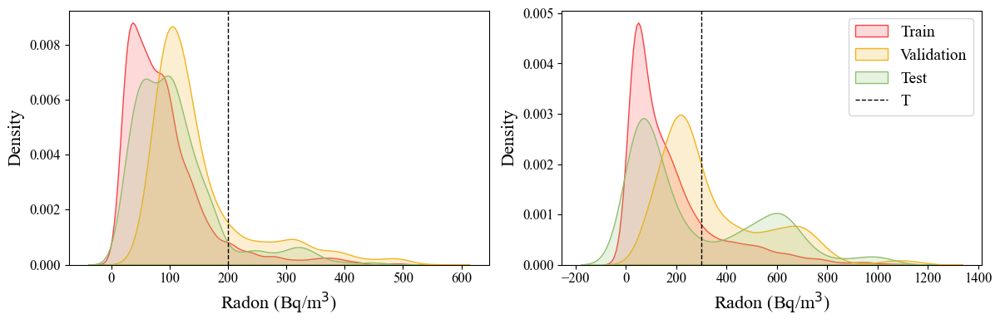

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# RG1 KDE
sns.kdeplot(rg1_train, ax=axes[0], label='Train', color=colors['Train'], fill=True, alpha=0.2)
sns.kdeplot(rg1_val, ax=axes[0], label='Validation', color=colors['Validation'], fill=True, alpha=0.2)
sns.kdeplot(rg1_test, ax=axes[0], label='Test', color=colors['Test'], fill=True, alpha=0.2)
axes[0].axvline(200, color='black', linestyle='--', linewidth=1, label="T")
axes[0].set_xlabel('Radon (Bq/m$^3$)', fontsize=16)
axes[0].set_ylabel('Density', fontsize=16)
axes[0].grid(False)
axes[0].tick_params( labelsize=12) 

# RG2 KDE
sns.kdeplot(rg2_train, ax=axes[1], label='Train', color=colors['Train'], fill=True, alpha=0.2)
sns.kdeplot(rg2_val, ax=axes[1], label='Validation', color=colors['Validation'], fill=True, alpha=0.2)
sns.kdeplot(rg2_test, ax=axes[1], label='Test', color=colors['Test'], fill=True, alpha=0.2)
axes[1].axvline(300, color='black', linestyle='--', linewidth=1, label="T")
axes[1].set_ylabel('Density', fontsize=16)
axes[1].set_xlabel('Radon (Bq/m$^3$)', fontsize=16)
axes[1].grid(False)
axes[1].tick_params( labelsize=12) 

axes[1].legend(loc='upper right', fontsize=14)

plt.tight_layout()
plt.show()

In [125]:
def find_best_temporal_split_permutations(series, threshold):
    """
    Finds the best temporal split (train/val/test) without shuffling,
    trying all permutations of block order and all combinations of val/test
    percentages in {5, 10, 15}, ensuring train > 0.
    """

    series = np.asarray(series).flatten()
    n = len(series)
    y_bin = (series > threshold).astype(int)

    # helper functions
    def compute_stats(block):
        """Return proportion of 1s and number of 0→1 transitions."""
        if len(block) < 2:
            return 0, 0
        ratio = np.mean(block)
        transitions = np.sum((block[1:] == 1) & (block[:-1] == 0))
        return ratio, transitions

    def score(stats):
        """Lower score = better similarity between blocks."""
        ratios, trans = zip(*stats)
        return np.std(ratios) + 0.01* np.std(trans)

    all_results = []

    # test and val % can each be 5, 10, or 15
    for val_p in [0.10, 0.15]:
        for test_p in [0.10, 0.15]:
            if val_p + test_p >= 1.0:
                continue
            train_p = 1.0 - val_p - test_p

            sizes = [
                int(n * train_p),
                int(n * val_p),
                int(n * test_p)
            ]
            labels = ["train", "val", "test"]

            # all 6 temporal permutations
            for perm in itertools.permutations(range(3)):
                order_labels = [labels[i] for i in perm]
                order_sizes = [sizes[i] for i in perm]

                # split the sequence in that temporal order
                idx = np.cumsum(order_sizes)
                start = 0
                blocks = []
                for end in idx:
                    blocks.append(y_bin[start:end])
                    start = end

                # compute stats and score
                stats = [compute_stats(b) for b in blocks]
                s = score(stats)

                result = {
                    "ratio": (train_p, val_p, test_p),
                    "order": order_labels,
                    "block_sizes": order_sizes,
                    "ratios_1": [round(st[0], 3) for st in stats],
                    "transitions": [st[1] for st in stats],
                    "score": s
                }
                all_results.append(result)

    # sort by best score
    all_results.sort(key=lambda x: x["score"])

    # Show top 5
    print("\n🔹 Top best combinations:")
    for r in all_results[:20]:
        tr, vr, te = r["ratio"]
        if vr==te: 
            print(f"  Ratio {int(tr*100)}:{int(vr*100)}:{int(te*100)} | "
                f"Order {r['order']} | y>thr {r['ratios_1']} | "
                f"Trans {r['transitions']} | Score={r['score']:.4f}")

    # Best one
    best = all_results[0]
    print("\n✅ Best split found:")
    print(f"   Ratio {int(best['ratio'][0]*100)}:{int(best['ratio'][1]*100)}:{int(best['ratio'][2]*100)}")
    print(f"   Order: {best['order']}")
    print(f"   y>threshold: {best['ratios_1']}")
    print(f"   Transitions: {best['transitions']}")
    print(f"   Score: {best['score']:.4f}")

    return best, all_results

In [100]:
best, all = find_best_temporal_split_permutations(RG1_2024_IA['Radon'], 200)


🔹 Top 10 best combinations:
  Ratio 70:15:15 | Order ['val', 'test', 'train'] | y>thr [np.float64(0.095), np.float64(0.233), np.float64(0.068)] | Trans [np.int64(2), np.int64(14), np.int64(40)] | Score=0.8651
  Ratio 70:15:15 | Order ['test', 'val', 'train'] | y>thr [np.float64(0.095), np.float64(0.233), np.float64(0.068)] | Trans [np.int64(2), np.int64(14), np.int64(40)] | Score=0.8651
  Ratio 75:10:15 | Order ['val', 'test', 'train'] | y>thr [np.float64(0.143), np.float64(0.203), np.float64(0.069)] | Trans [np.int64(2), np.int64(13), np.int64(41)] | Score=0.8755
  Ratio 75:15:10 | Order ['test', 'val', 'train'] | y>thr [np.float64(0.143), np.float64(0.203), np.float64(0.069)] | Trans [np.int64(2), np.int64(13), np.int64(41)] | Score=0.8755
  Ratio 75:10:15 | Order ['test', 'val', 'train'] | y>thr [np.float64(0.095), np.float64(0.305), np.float64(0.069)] | Trans [np.int64(2), np.int64(13), np.int64(41)] | Score=0.9262
  Ratio 75:15:10 | Order ['val', 'test', 'train'] | y>thr [np.floa

In [89]:
best, all = find_best_temporal_split_permutations(RG2_2024_IA['Radon'], 300)


🔹 Top 10 best combinations:
  Ratio 70:15:15 | Order ['val', 'test', 'train'] | y>thr [np.float64(0.365), np.float64(0.413), np.float64(0.177)] | Trans [np.int64(3), np.int64(25), np.int64(50)] | Score=1.0617
  Ratio 70:15:15 | Order ['test', 'val', 'train'] | y>thr [np.float64(0.365), np.float64(0.413), np.float64(0.177)] | Trans [np.int64(3), np.int64(25), np.int64(50)] | Score=1.0617
  Ratio 70:15:15 | Order ['train', 'val', 'test'] | y>thr [np.float64(0.293), np.float64(0.138), np.float64(0.101)] | Trans [np.int64(58), np.int64(7), np.int64(13)] | Score=1.2210
  Ratio 70:15:15 | Order ['train', 'test', 'val'] | y>thr [np.float64(0.293), np.float64(0.138), np.float64(0.101)] | Trans [np.int64(58), np.int64(7), np.int64(13)] | Score=1.2210
  Ratio 75:10:15 | Order ['test', 'val', 'train'] | y>thr [np.float64(0.365), np.float64(0.478), np.float64(0.184)] | Trans [np.int64(3), np.int64(18), np.int64(57)] | Score=1.2592
  Ratio 75:15:10 | Order ['val', 'test', 'train'] | y>thr [np.floa

In [ ]:
def split_bins_best_distribution(y, n_blocks=10):
    
    y = np.array(y).flatten()
    n = len(y)
    block_size = n // n_blocks

    # Create temporal blocks
    block_indices = []
    for i in range(n_blocks):
        start = i * block_size
        end = n if i == n_blocks - 1 else (i + 1) * block_size
        block_indices.append(np.arange(start, end))

    # Generate all combinations: choose 8 blocks for training, 1 for val and 1 for test
    all_blocks = np.arange(n_blocks)
    best_score = float('inf')
    best_split = None

    for train_blocks in combinations(all_blocks, 8):
        remaining_blocks = [b for b in all_blocks if b not in train_blocks]
        for val_block, test_block in permutations(remaining_blocks, 2):
            # gather y values
            train_y = np.concatenate([y[block_indices[b]] for b in train_blocks])
            val_y = y[block_indices[val_block]]
            test_y = y[block_indices[test_block]]

            # similarity metric (sum of Wasserstein distances)
            score = (wasserstein_distance(train_y, val_y) +
                     wasserstein_distance(train_y, test_y) +
                     wasserstein_distance(val_y, test_y))

            if score < best_score:
                best_score = score
                best_split = {'train': train_blocks,
                              'val': [val_block],
                              'test': [test_block]}

    print("Best temporal block split (train/val/test):", best_split)


    plt.figure(figsize=(12, 4))
    plt.hist(np.concatenate([y[block_indices[b]] for b in best_split['train']]), bins=50, alpha=0.5, label='Train')
    plt.hist(y[block_indices[best_split['val'][0]]], bins=50, alpha=0.5, label='Validation')
    plt.hist(y[block_indices[best_split['test'][0]]], bins=50, alpha=0.5, label='Test')
    plt.title("Target Distribution per Temporal Split (Best)")
    plt.xlabel("Radon Value")
    plt.ylabel("Count")
    plt.legend()
    plt.show()

    return best_split, block_indices


Best temporal block split (train/val/test): {'train': (np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(7), np.int64(8), np.int64(9)), 'val': [np.int64(0)], 'test': [np.int64(6)]}


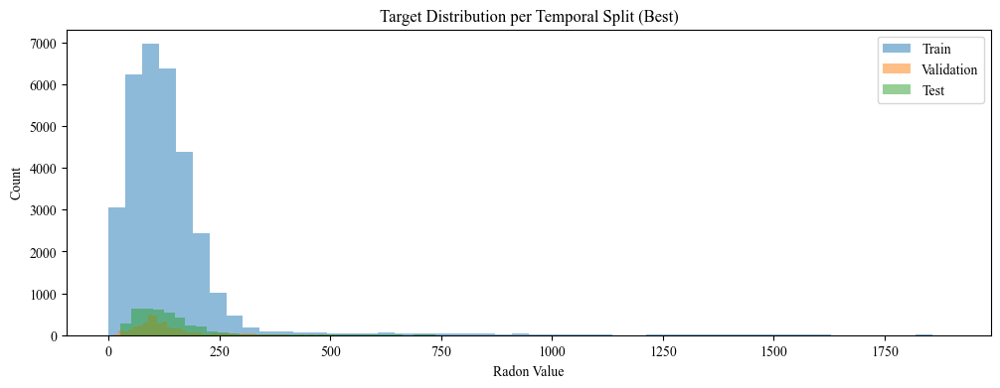

In [16]:
y = RG1_2024['Radon'].values
best_split, block_indices = split_bins_best_distribution(y, n_blocks=10)

Best temporal block split (train/val/test): {'train': (np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7)), 'val': [np.int64(8)], 'test': [np.int64(9)]}


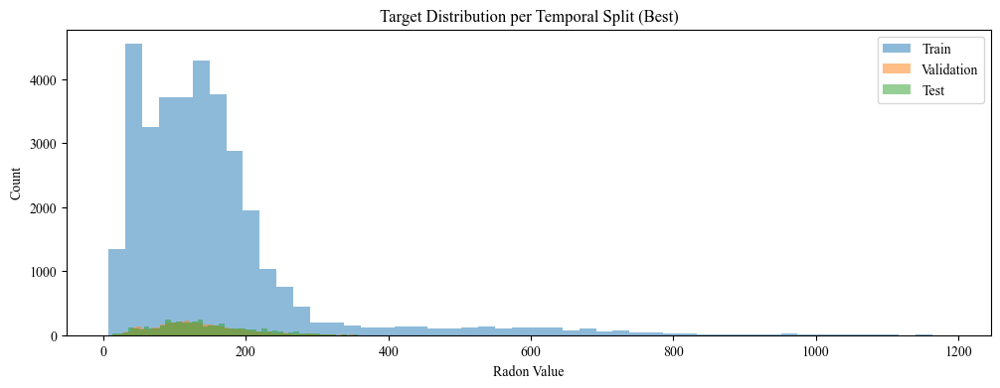

In [17]:
y = RG2_2024['Radon'].values
best_split, block_indices = split_bins_best_distribution(y, n_blocks=10)

This images show no high difference betwen temporal 8:1:1 split ad those more optimum (= for RG2). I.e. we mantain the temporal 8:1:1 split

# 5. Data augmentation analysis



Running pipeline for ../data/RG1.csv
Original y = 75.0 -> Scaled y = 0.013719303059404582
Original y = 255.0 -> Scaled y = 2.4831938537522293
Original y = 270.0 -> Scaled y = 2.688983399643298
Original y = 285.0 -> Scaled y = 2.894772945534367
Original y = 300.0 -> Scaled y = 3.1005624914254355
Original y = 600.0 -> Scaled y = 7.2163534092468105
y_bin_train_seq: 12 transitions (0→1)
y_bin_train_seq: 11 transitions (1→0)
y_bin_val_seq: 8 transitions (0→1)
y_bin_val_seq: 8 transitions (1→0)
y_bin_test_seq: 2 transitions (0→1)
y_bin_test_seq: 2 transitions (1→0)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
0
jittering with noise [[-0.13421034 -0.07786312 -0.10767268 -0.24558481 -0.15827259  0.01215645]
 [ 0.06078735  0.27224337  0.06251003  0.2424958  -0.20621756  0.07400895]
 [-0.06673758  0.20288739  0.19703465 -0.06340226  0.08003939 -0.30628793]
 [-0.24680827  0.06068028 -0.17796133 -0.35431226 -0.05105705  0.03325394]
 [ 0.00712874 -0.00989033 -0.20549351  0.09008863 -0.076594

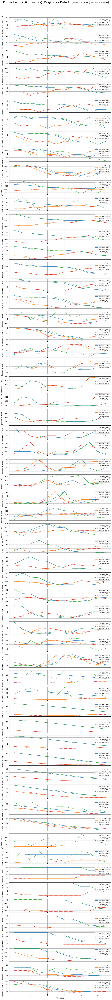



Running pipeline for ../data/RG2.csv
Original y = 75.0 -> Scaled y = -0.2154696132596685
Original y = 255.0 -> Scaled y = 0.7790055248618785
Original y = 270.0 -> Scaled y = 0.861878453038674
Original y = 285.0 -> Scaled y = 0.9447513812154696
Original y = 300.0 -> Scaled y = 1.0276243093922652
Original y = 600.0 -> Scaled y = 2.685082872928177
y_bin_train_seq: 50 transitions (0→1)
y_bin_train_seq: 50 transitions (1→0)
y_bin_val_seq: 23 transitions (0→1)
y_bin_val_seq: 23 transitions (1→0)
y_bin_test_seq: 6 transitions (0→1)
y_bin_test_seq: 7 transitions (1→0)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
0
scaling with factor 0.9165402007988153
magnitude warping with factor 1.2005140151177076
magnitude warping with factor 0.9466229418120485
magnitude warping with factor 1.093166861085011
1
2
jittering with noise [[ 0.36145849 -0.35308744  0.34258446  0.07912949  0.32657978 -0.4816124 ]
 [-0.12862445  0.0629669  -0.15471849 -0.17759356 -0.51114743  0.02205694]
 [ 0.1229261   0.02

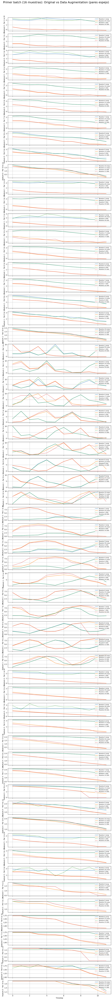

In [2]:
for file in ["../data/RG1.csv", "../data/RG2.csv"]:
    print(f"\n\nRunning pipeline for {file}")
    (X_train, y_train, y_train_bin, w_train, w_train_reg), (X_val, y_val, y_val_bin, w_val, w_val_reg), (X_test, y_test, y_test_bin, w_test, w_test_reg), scaler, scaler_y, train_std = preprocess_data(file, lookback=12, forecast=3)
    train_loader_original, _ , _= create_dataloaders(X_train, y_train, y_train_bin, w_train,w_train_reg, X_val, y_val, y_val_bin, w_val, w_val_reg, X_test, y_test, y_test_bin, w_test, w_test_reg,
                                                                scaler=scaler, train_std=train_std, batch_size=20, dataaug=False, shuffle=False)
    train_loader_da, _ , _= create_dataloaders(X_train, y_train, y_train_bin, w_train,w_train_reg, X_val, y_val, y_val_bin, w_val, w_val_reg, X_test, y_test, y_test_bin, w_test, w_test_reg,
                                                            scaler=scaler, train_std=train_std, batch_size=20, dataaug=True, shuffle=False)
    batch_original = next(iter(train_loader_original))
    batch_da = next(iter(train_loader_da))
    
    X_orig = batch_original[0]  # (batch, seq_len, features)
    X_da = batch_da[0]          # (batch, seq_len, features)

    X_orig_16 = X_orig[:20].cpu().numpy()
    X_da_16   = X_da[:20].cpu().numpy()

    seq_len = X_orig_16.shape[1]
    features = X_orig_16.shape[2]

    fig, axes = plt.subplots(features * 10, 1, figsize=(10, 90), sharex=True)
    fig.suptitle("Primer batch (16 muestras): Original vs Data Augmentation (pares espejo)", fontsize=18)

    for f in range(features):   # 3 features
        for p in range(10):      # 8 pares
            ax = axes[f*10 + p]
            
            # Índices del par (espejo)
            i = p + 1           # índice lógico (1-based)
            j =20- p          # espejo
            
            # Serie original
            ax.plot(range(seq_len), X_orig_16[i-1, :, f], label=f"Muestra {i} (orig)", alpha=0.9)
            ax.plot(range(seq_len), X_orig_16[j-1, :, f], label=f"Muestra {j} (orig)", alpha=0.9)
            
            # Serie augmentada
            ax.plot(range(seq_len), X_da_16[i-1, :, f], linestyle="--", label=f"Muestra {i} (DA)", alpha=0.9)
            ax.plot(range(seq_len), X_da_16[j-1, :, f], linestyle="--", label=f"Muestra {j} (DA)", alpha=0.9)
            
            ax.set_ylabel(f"Feature {f} - Par {i} & {j}")
            ax.grid(True)
            ax.legend(loc="upper right", fontsize=8)

    axes[-1].set_xlabel("Timestep")
    plt.tight_layout(rect=[0,0,1,0.97])
    plt.show()

# 6. Time series analysis

In [17]:
def test_stationarity(series, series_name="Serie", lags_list=[12, 36, 72, 144,360]):
    print(f"\n=== {series_name} ===")
    
    for lag in lags_list:
        print(f"\n--- Testing with lag = {lag} ---")
        # ADF
        adf_result = adfuller(series, maxlag=lag)
        print("ADF Test:")
        print(f"ADF Statistic: {adf_result[0]:.4f}")
        print(f"p-value: {adf_result[1]:.4e}")
        # KPSS
        kpss_result = kpss(series, regression='c', nlags=lag)
        print("KPSS Test:")
        print(f"KPSS Statistic: {kpss_result[0]:.4f}")
        print(f"p-value: {kpss_result[1]:.4f}")

# Function to plot ACF/PACF for a given lag
def plot_acf_pacf(series, lags=360, title_prefix="Serie"):
    plt.figure(figsize=(18,4))
    plt.plot(series)
    plt.title(f"{title_prefix} - Original")
    plt.xlabel("Tiempo")
    plt.ylabel("Valor")
    plt.show()
    
    plt.figure(figsize=(8,3))
    plot_acf(series, lags=lags, ax=plt.gca())
    #plt.title(f"ACF - {title_prefix}")
    plt.xlabel("Lags")
    plt.ylabel("ACF")
    plt.show()
    
    plt.figure(figsize=(12,4))
    plot_pacf(series, lags=lags, ax=plt.gca())
    plt.title(f"PACF - {title_prefix}")
    plt.show()



========== Dataset: RG1 ==========

=== RG1 original ===

--- Testing with lag = 12 ---
ADF Test:
ADF Statistic: -8.6009
p-value: 6.8733e-14
KPSS Test:
KPSS Statistic: 7.5654
p-value: 0.0100

--- Testing with lag = 36 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -9.0793
p-value: 4.0974e-15
KPSS Test:
KPSS Statistic: 3.0019
p-value: 0.0100

--- Testing with lag = 72 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -9.0793
p-value: 4.0974e-15
KPSS Test:
KPSS Statistic: 1.8435
p-value: 0.0100

--- Testing with lag = 144 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -9.0793
p-value: 4.0974e-15
KPSS Test:
KPSS Statistic: 1.1838
p-value: 0.0100

--- Testing with lag = 360 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -9.0793
p-value: 4.0974e-15
KPSS Test:
KPSS Statistic: 0.6806
p-value: 0.0153


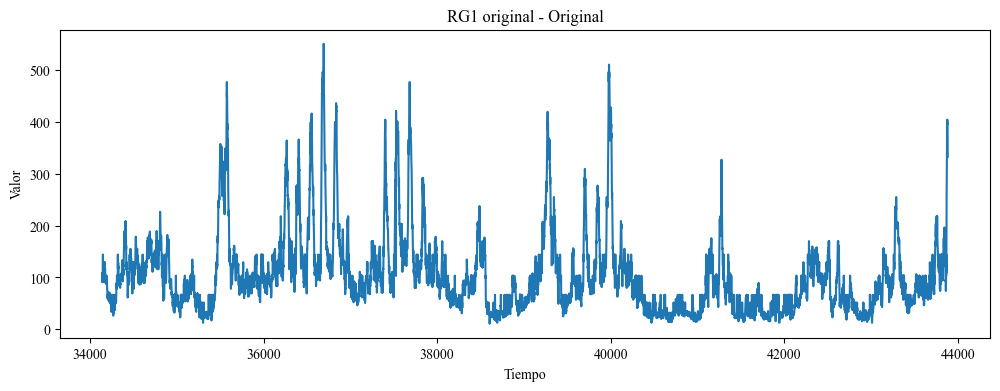

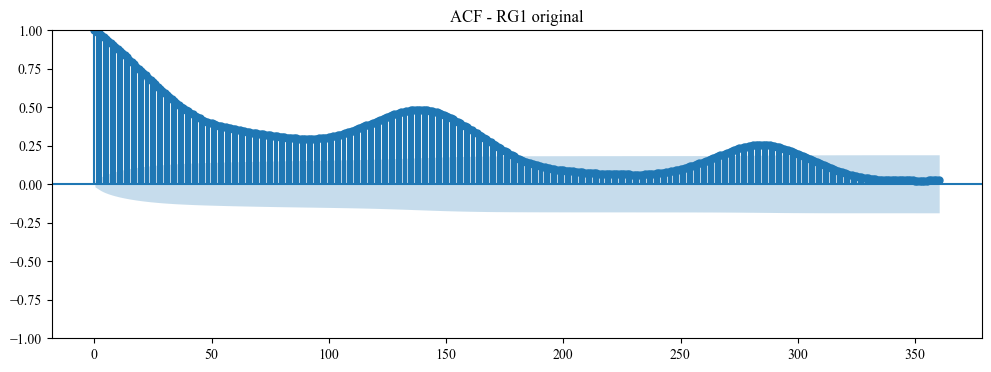

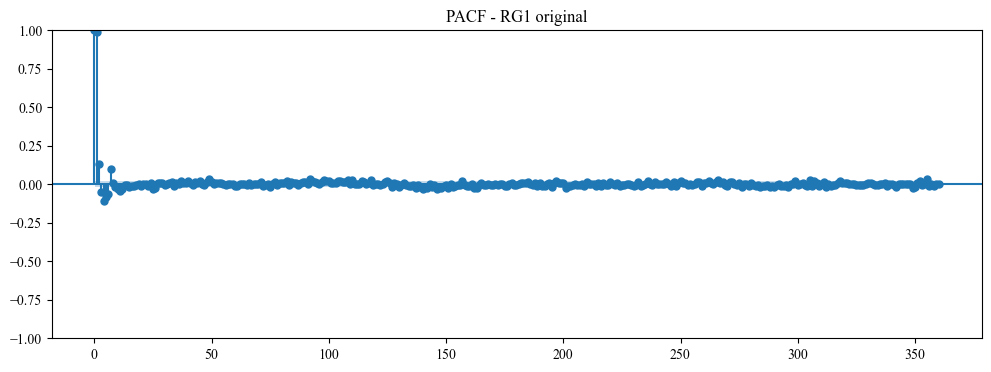


=== RG1 first difference ===

--- Testing with lag = 12 ---
ADF Test:
ADF Statistic: -26.1649
p-value: 0.0000e+00
KPSS Test:
KPSS Statistic: 0.0182
p-value: 0.1000

--- Testing with lag = 36 ---
ADF Test:
ADF Statistic: -17.8987
p-value: 2.9590e-30
KPSS Test:
KPSS Statistic: 0.0163
p-value: 0.1000

--- Testing with lag = 72 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)
C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -18.0866
p-value: 2.5776e-30
KPSS Test:
KPSS Statistic: 0.0231
p-value: 0.1000

--- Testing with lag = 144 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -16.4144
p-value: 2.5657e-29
KPSS Test:
KPSS Statistic: 0.0563
p-value: 0.1000

--- Testing with lag = 360 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -16.4144
p-value: 2.5657e-29
KPSS Test:
KPSS Statistic: 0.0702
p-value: 0.1000


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


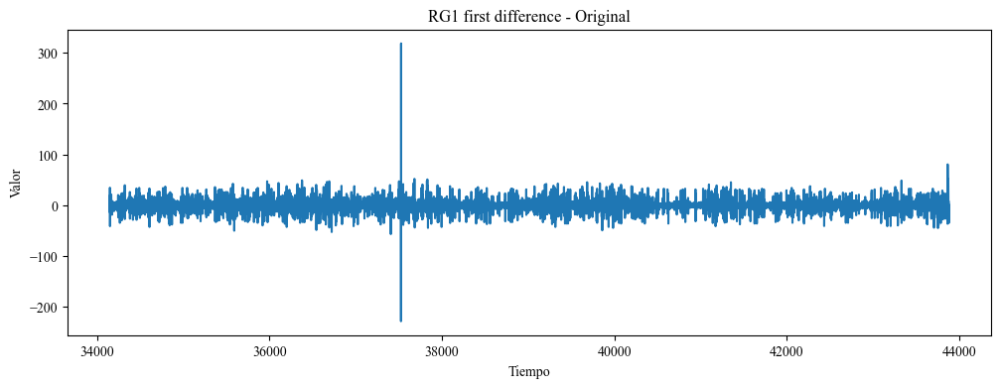

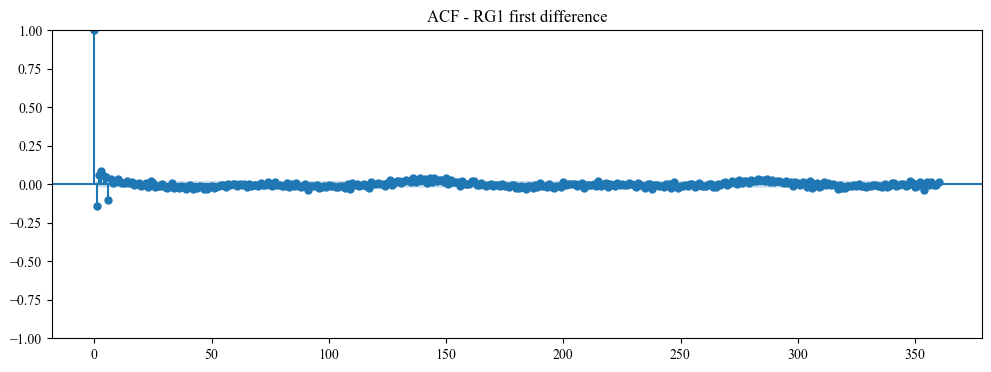

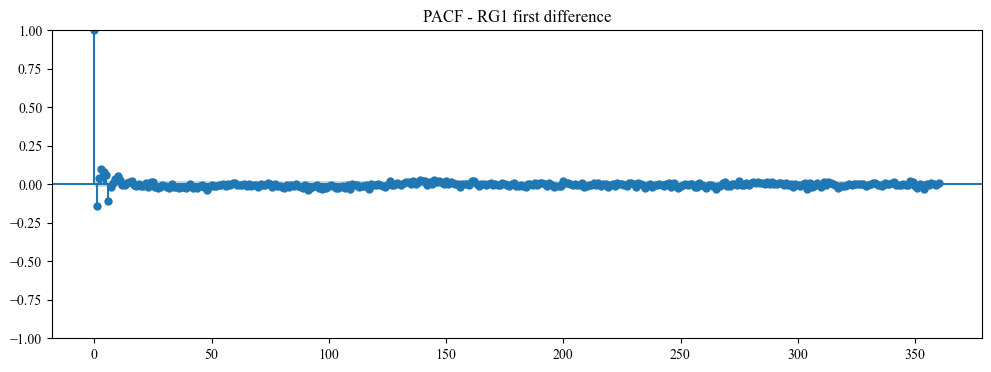



========== Dataset: RG2 ==========

=== RG2 original ===

--- Testing with lag = 12 ---
ADF Test:
ADF Statistic: -9.5882
p-value: 2.0698e-16
KPSS Test:
KPSS Statistic: 12.1575
p-value: 0.0100

--- Testing with lag = 36 ---
ADF Test:
ADF Statistic: -9.2667
p-value: 1.3605e-15
KPSS Test:
KPSS Statistic: 4.9614
p-value: 0.0100

--- Testing with lag = 72 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)
C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -9.2667
p-value: 1.3605e-15
KPSS Test:
KPSS Statistic: 3.1923
p-value: 0.0100

--- Testing with lag = 144 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -3.0285
p-value: 3.2316e-02
KPSS Test:
KPSS Statistic: 2.1072
p-value: 0.0100

--- Testing with lag = 360 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -3.3076
p-value: 1.4541e-02
KPSS Test:
KPSS Statistic: 1.0452
p-value: 0.0100


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


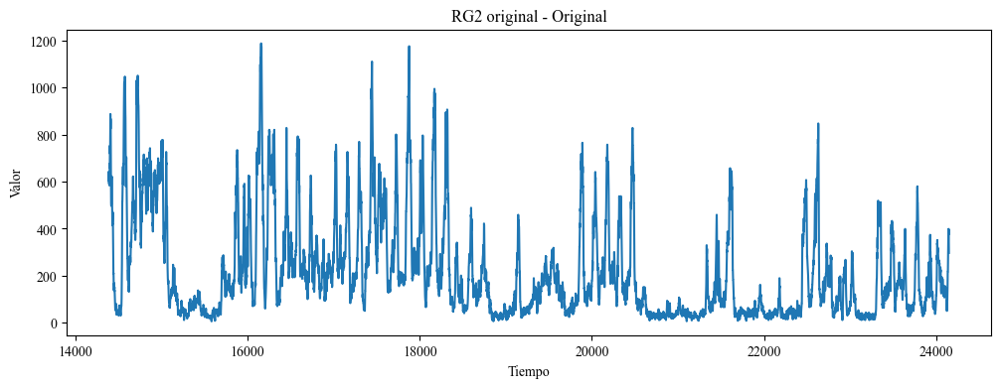

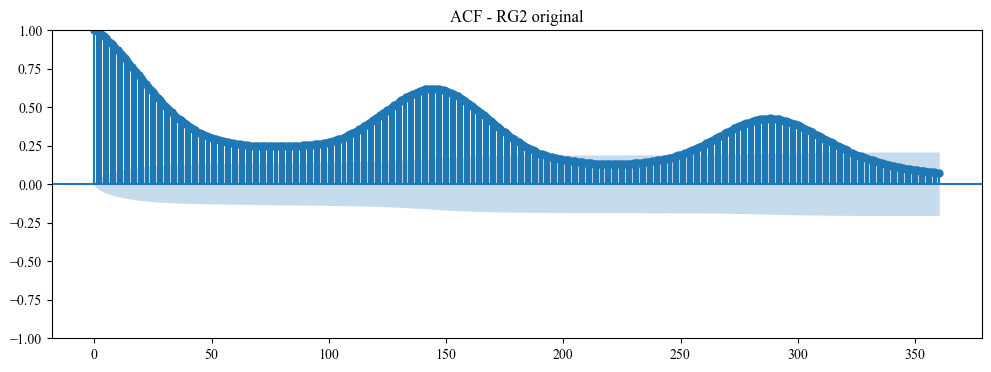

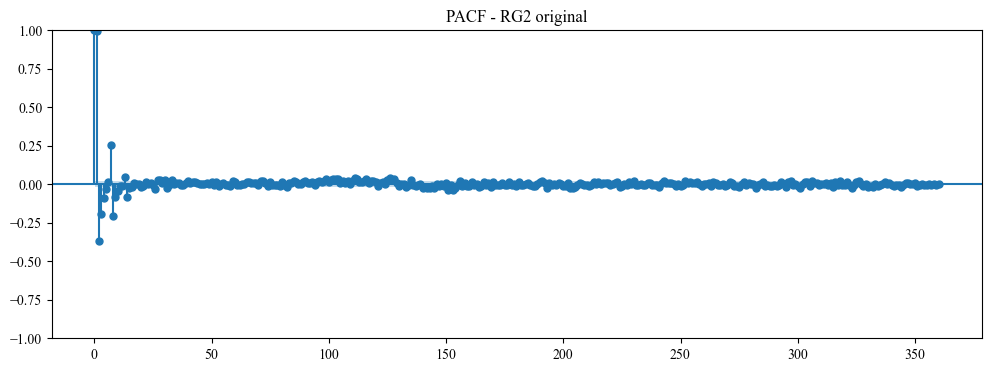


=== RG2 first difference ===

--- Testing with lag = 12 ---
ADF Test:
ADF Statistic: -22.4954
p-value: 0.0000e+00
KPSS Test:
KPSS Statistic: 0.0080
p-value: 0.1000

--- Testing with lag = 36 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -18.9425
p-value: 0.0000e+00
KPSS Test:
KPSS Statistic: 0.0071
p-value: 0.1000

--- Testing with lag = 72 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -16.4750
p-value: 2.2647e-29
KPSS Test:
KPSS Statistic: 0.0107
p-value: 0.1000

--- Testing with lag = 144 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -13.1715
p-value: 1.2477e-24
KPSS Test:
KPSS Statistic: 0.0399
p-value: 0.1000

--- Testing with lag = 360 ---


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


ADF Test:
ADF Statistic: -11.0930
p-value: 4.0373e-20
KPSS Test:
KPSS Statistic: 0.0429
p-value: 0.1000


C:\Users\Lidia\AppData\Local\Temp\ipykernel_60544\168663022.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


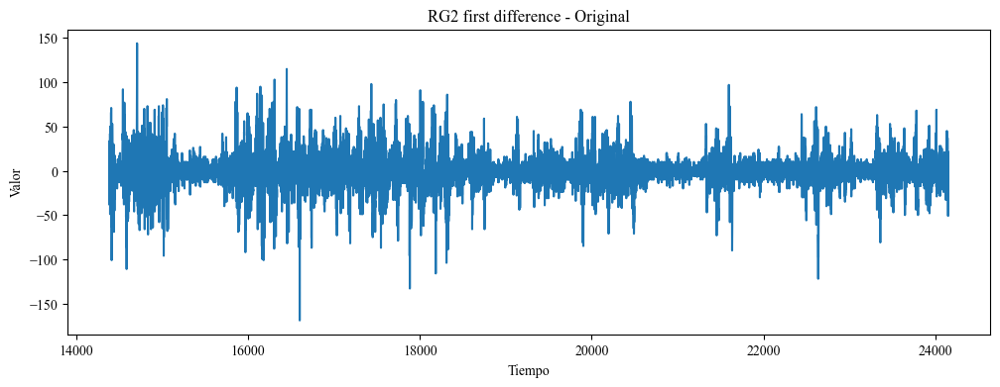

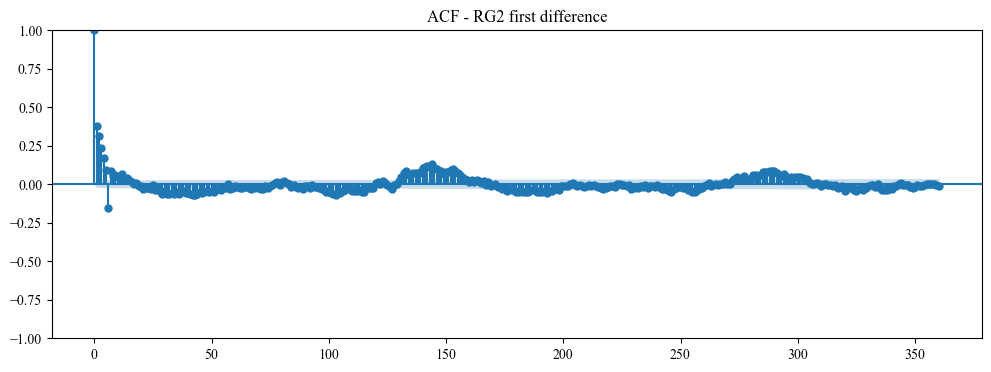

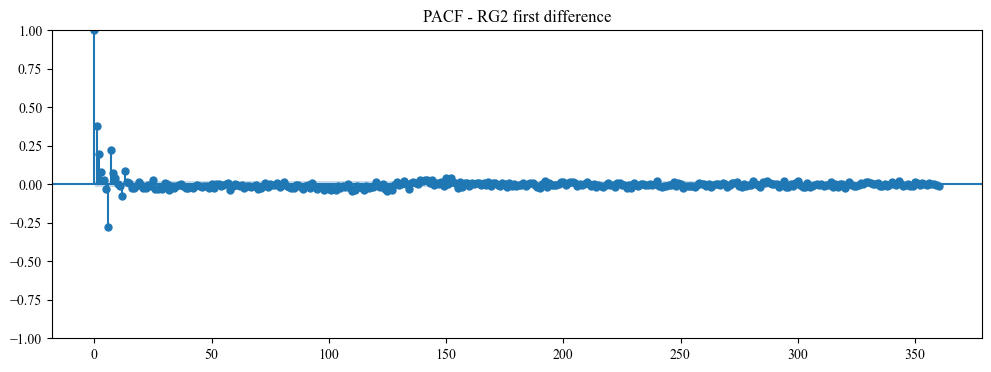

In [ ]:
datasets = {
    "RG1": RG1_2024_IA["Radon"],
    "RG2": RG2_2024_IA["Radon"]
}

for name, data in datasets.items():
    print(f"\n\n========== Dataset: {name} ==========")
    
    # Original series
    test_stationarity(data, f"{name} original", lags_list=[12, 36,72, 144,360])
    plot_acf_pacf(data, lags=360, title_prefix=f"{name} original")
    
    # First difference
    diff_data = data.diff().dropna()
    test_stationarity(diff_data, f"{name} first difference", lags_list=[12, 36,72, 144,360])
    plot_acf_pacf(diff_data, lags=360, title_prefix=f"{name} first difference")



========== Dataset: RG1 ==========

=== RG1 original ===

--- Testing with lag = 36 ---
ADF Test:
ADF Statistic: -9.0220
p-value: 5.7430e-15
KPSS Test:
KPSS Statistic: 3.0007
p-value: 0.0100


C:\Users\Lidia\AppData\Local\Temp\ipykernel_31820\811360447.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


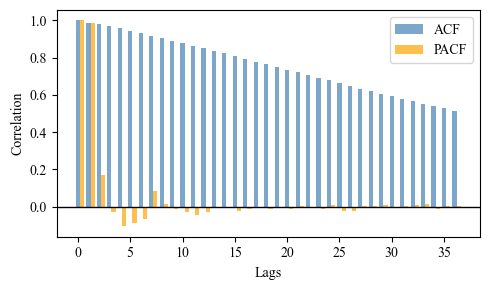



========== Dataset: RG2 ==========

=== RG2 original ===

--- Testing with lag = 36 ---
ADF Test:
ADF Statistic: -9.2667
p-value: 1.3605e-15
KPSS Test:
KPSS Statistic: 4.9614
p-value: 0.0100


C:\Users\Lidia\AppData\Local\Temp\ipykernel_31820\811360447.py:12: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags=lag)


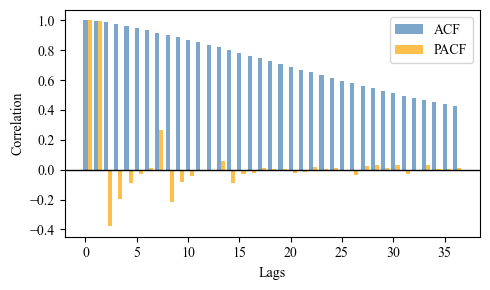

In [46]:
datasets = {
    "RG1": RG1_2024_IA["Radon"],
    "RG2": RG2_2024_IA["Radon"]
}

for name, data in datasets.items():
    print(f"\n\n========== Dataset: {name} ==========")
    
    
    # Original series
    test_stationarity(data, f"{name} original", lags_list=[36])
    plot_acf_pacf(data, lags=36)


In [64]:

def plot_acf_pacf_4panel(data1, data2, lags=36):
    """
    Plots ACF & PACF for two datasets in 4 subplots:
        - Col 1: data1 (original top, first difference bottom)
        - Col 2: data2 (original top, first difference bottom)
    """
    fig, axes = plt.subplots(2, 2, figsize=(8, 5), sharex=True, sharey=True)
    
    datasets = {"RG1": data1, "RG2": data2}
    
    for col, (name, data) in enumerate(datasets.items()):
        # Serie original
        acf_vals = acf(data, nlags=lags, fft=False)
        pacf_vals = pacf(data, nlags=lags, method='yw')
        lags_range = range(len(acf_vals))
        conf = 1.96 / (len(data) ** 0.5)
        
        ax = axes[0, col]
        ax.bar(lags_range, acf_vals, width=0.4, color='steelblue', alpha=0.7, label='ACF')
        ax.bar([l + 0.4 for l in lags_range], pacf_vals, width=0.4, color='orange', alpha=0.7, label='PACF')
        ax.axhline(0, color='black', linewidth=1)
        ax.axhline(conf, color='gray', linestyle='--', linewidth=0.8)
        ax.axhline(-conf, color='gray', linestyle='--', linewidth=0.8)
        if col==0:
            ax.set_ylabel("Correlation")
        ax.legend()
        
        # Primera diferencia
        diff_data = data.diff().dropna()
        acf_vals = acf(diff_data, nlags=lags, fft=False)
        pacf_vals = pacf(diff_data, nlags=lags, method='yw')
        lags_range = range(len(acf_vals))
        conf = 1.96 / (len(diff_data) ** 0.5)
        
        
        ax = axes[1, col]
        ax.bar(lags_range, acf_vals, width=0.4, color='steelblue', alpha=0.7, label='ACF')
        ax.bar([l + 0.4 for l in lags_range], pacf_vals, width=0.4, color='orange', alpha=0.7, label='PACF')
        ax.axhline(0, color='black', linewidth=1)
        ax.axhline(conf, color='gray', linestyle='--', linewidth=0.8)
        ax.axhline(-conf, color='gray', linestyle='--', linewidth=0.8)
        ax.set_xlabel("Lags")
        if col==0:
            ax.set_ylabel("Correlation")
        ax.legend()
    
    plt.tight_layout()
    plt.show()

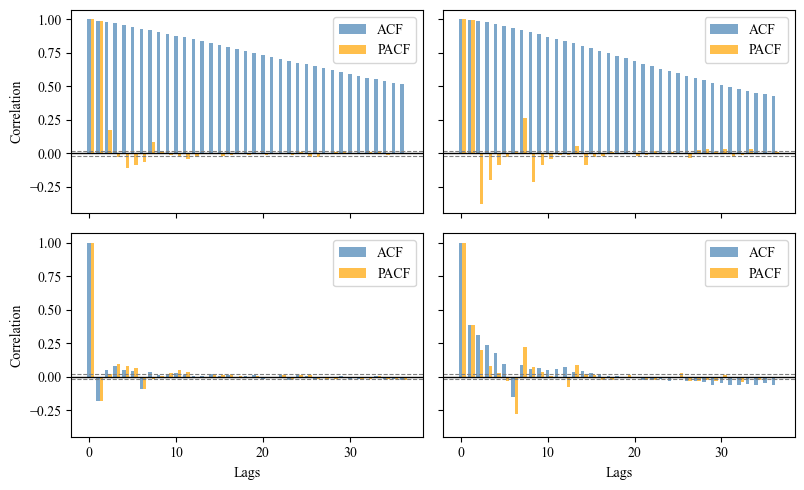

In [65]:
plot_acf_pacf_4panel(RG1_2024_IA["Radon"], RG2_2024_IA["Radon"], lags=36)


# 7. Analysis of data properties 

In [74]:
plt.rcParams["font.family"] = "Times New Roman"

def plot_radon_dynamics(data, n_segments=8, radon_col='Radon', ventil_col='Ventilador', time_col='DateTime'):

    # --- Prepare data ---
    df = data.copy().sort_values(by=time_col)
    df = df.dropna(subset=[radon_col])  # ensure no NaNs

    # compute standardized radon
    df['Radon_std'] = (df[radon_col] - df[radon_col].mean()) / df[radon_col].std()

    # compute differences and proportional derivatives
    df['Radon_diff'] = df[radon_col].diff()
    df['Radon_prop_diff'] = df['Radon_diff'] / df[radon_col].shift(1)

    # --- Create time splits ---
    t_min, t_max = df[time_col].min(), df[time_col].max()
    time_splits = pd.date_range(start=t_min, end=t_max, periods=n_segments + 1)

    # --- Create figure ---
    fig, axes = plt.subplots(n_segments, 3, figsize=(18, 20), sharey=False)
    fig.suptitle("Radon dynamics: standardized, derivative, proportional derivative", fontsize=16)

    for i in range(n_segments):
        t_start, t_end = time_splits[i], time_splits[i+1]
        df_seg = df[(df[time_col] >= t_start) & (df[time_col] <= t_end)]

        for j, col in enumerate(['Radon_std', 'Radon_diff', 'Radon_prop_diff']):
            ax = axes[i, j]
            ax.plot(df_seg[time_col], df_seg[col], linewidth=1.5)

            # reference line at zero
            ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)

            # vertical month lines
            for d in pd.date_range(start=t_start.normalize(), end=t_end.normalize(), freq='MS'):
                ax.axvline(x=d, color="lightgray", linestyle="--", linewidth=0.7, alpha=0.6)

            # shade regions where ventilator is on
            vent = df_seg[ventil_col].values
            times = df_seg[time_col].values
            in_interval = False
            for k in range(len(vent)):
                if vent[k] == 1 and not in_interval:
                    start_time = times[k]
                    in_interval = True
                elif vent[k] == 0 and in_interval:
                    end_time = times[k]
                    ax.axvspan(start_time, end_time, color="grey", alpha=0.2)
                    in_interval = False
            if in_interval:
                ax.axvspan(start_time, t_end, color="grey", alpha=0.2)

            # labels and limits
            ax.set_xlim([t_start, t_end])
            if i == n_segments - 1:
                ax.set_xlabel("Date", fontsize=12)
            if j == 0:
                ax.set_ylabel(f"Segment {i+1}", fontsize=10)

            # column titles
            if i == 0:
                titles = ["Standardized Radon", "Derivative", "Proportional Derivative"]
                ax.set_title(titles[j], fontsize=13)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

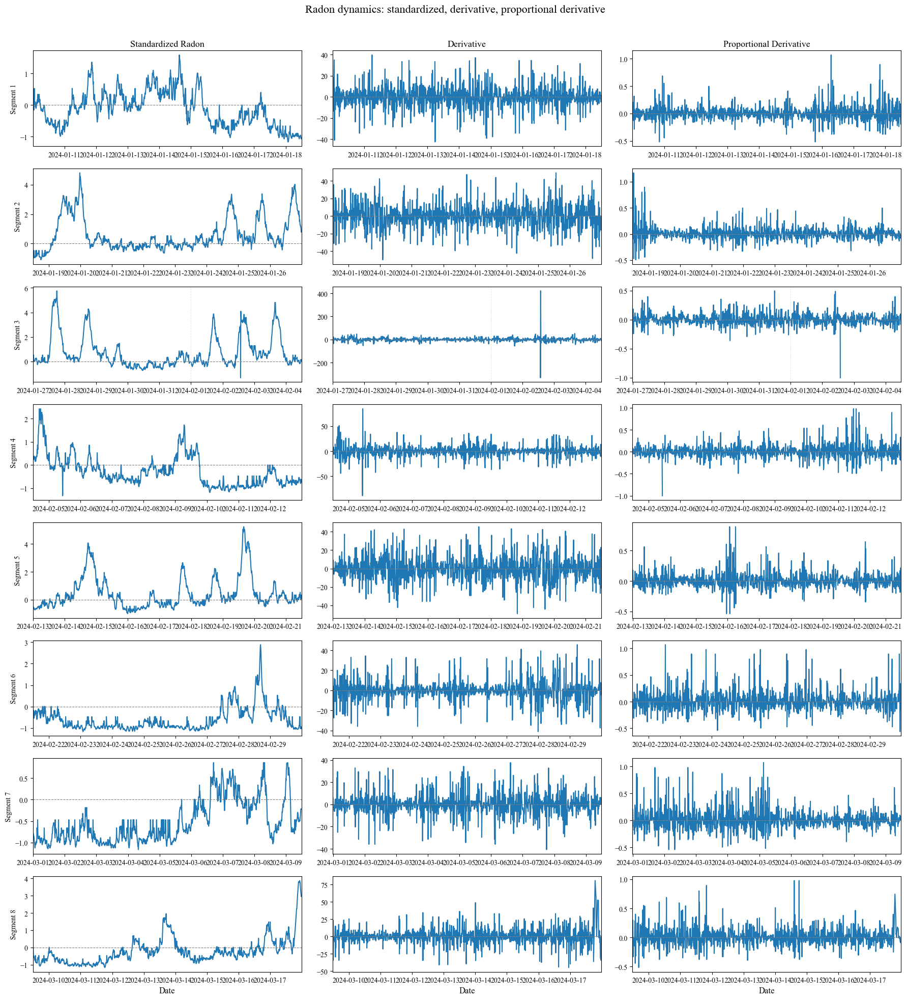

In [75]:
plot_radon_dynamics(RG1_2024_IA)

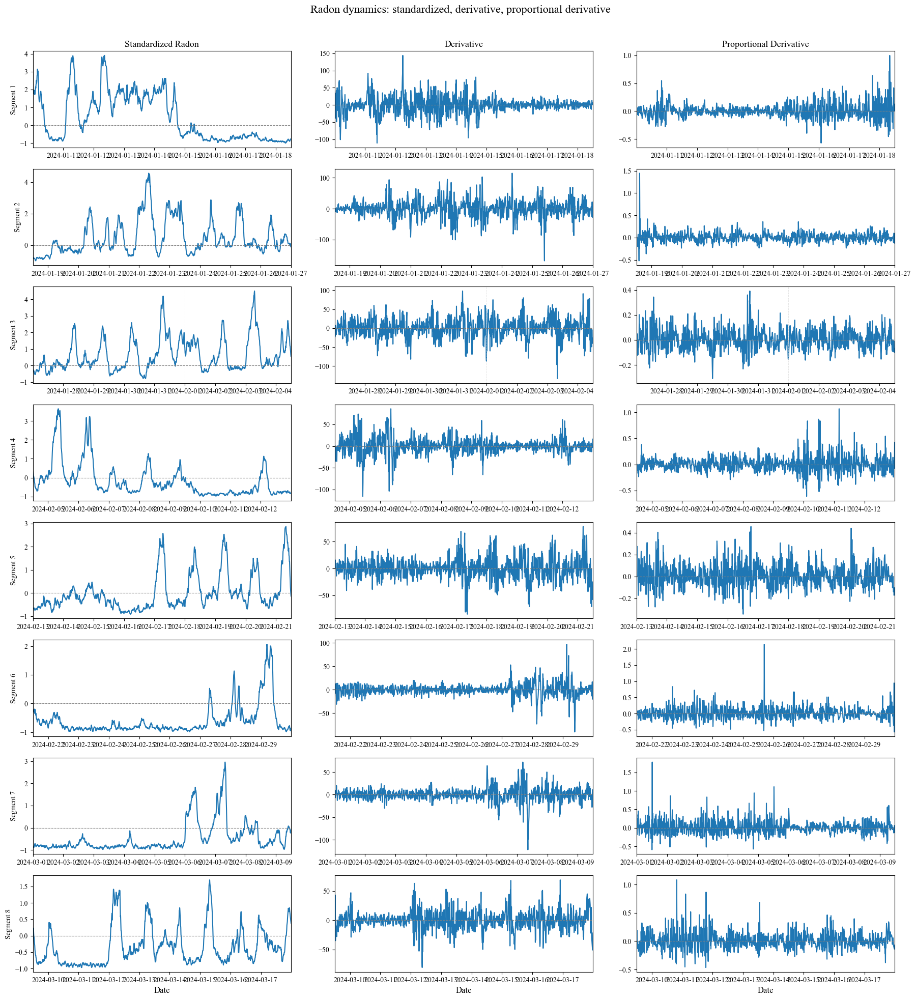

In [76]:
plot_radon_dynamics(RG2_2024_IA)

Como la derivada y derivada proporcional son altamente ruidosas hacemos transformaciones frequencia

In [78]:

plt.rcParams["font.family"] = "Times New Roman"

def plot_radon_spectral_analysis(data, radon_col='Radon', time_col='DateTime', fs=None):
    """
    Computes and plots the spectral components of Radon differences and proportional differences.

    Parameters
    ----------
    data : pd.DataFrame
        DataFrame containing columns [DateTime, Radon].
    radon_col : str
        Name of the Radon concentration column.
    time_col : str
        Name of the datetime column.
    fs : float, optional
        Sampling frequency in samples per hour (or per day). 
        If None, it is estimated from the median sampling interval.
    """

    # --- prepare data ---
    df = data.copy().dropna(subset=[radon_col])
    df = df.sort_values(by=time_col)
    t = pd.to_datetime(df[time_col])

    # Estimate sampling frequency if not given
    dt = np.median(np.diff(t.values).astype('timedelta64[s]').astype(float))  # seconds
    if fs is None:
        fs = 1 / (dt / 3600)  # samples per hour

    # --- compute derivatives ---
    radon = df[radon_col].values
    radon_diff = np.diff(radon)
    radon_prop_diff = radon_diff / radon[:-1]

    # --- prepare frequency axis ---
    n = len(radon_diff)
    freqs = np.fft.rfftfreq(n, d=1/fs)
    fft_diff = np.fft.rfft(radon_diff - np.mean(radon_diff))
    fft_prop = np.fft.rfft(radon_prop_diff - np.mean(radon_prop_diff))

    amp_diff = np.abs(fft_diff)
    amp_prop = np.abs(fft_prop)

    # --- Power Spectral Density (Welch) for smoother spectra ---
    f_welch_diff, psd_diff = welch(radon_diff, fs=fs, nperseg=min(1024, len(radon_diff)))
    f_welch_prop, psd_prop = welch(radon_prop_diff, fs=fs, nperseg=min(1024, len(radon_prop_diff)))

    # --- plotting ---
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # FFT amplitudes
    axes[0, 0].plot(freqs, amp_diff, color='tab:blue')
    axes[0, 0].set_title("FFT amplitude - Derivative")
    axes[0, 0].set_xlabel("Frequency [1/hour]")
    axes[0, 0].set_ylabel("Amplitude")
    axes[0, 0].set_xlim(0, fs/2)

    axes[0, 1].plot(freqs, amp_prop, color='tab:orange')
    axes[0, 1].set_title("FFT amplitude - Proportional Derivative")
    axes[0, 1].set_xlabel("Frequency [1/hour]")
    axes[0, 1].set_ylabel("Amplitude")
    axes[0, 1].set_xlim(0, fs/2)

    # PSD (smoother view)
    axes[1, 0].semilogy(f_welch_diff, psd_diff, color='tab:blue')
    axes[1, 0].set_title("Power Spectral Density - Derivative (Welch)")
    axes[1, 0].set_xlabel("Frequency [1/hour]")
    axes[1, 0].set_ylabel("PSD")

    axes[1, 1].semilogy(f_welch_prop, psd_prop, color='tab:orange')
    axes[1, 1].set_title("Power Spectral Density - Proportional Derivative (Welch)")
    axes[1, 1].set_xlabel("Frequency [1/hour]")
    axes[1, 1].set_ylabel("PSD")

    plt.tight_layout()
    plt.show()

    # return raw spectra for further analysis if needed
    return {
        "freqs_fft": freqs,
        "fft_diff": fft_diff,
        "fft_prop": fft_prop,
        "freqs_welch": f_welch_diff,
        "psd_diff": psd_diff,
        "psd_prop": psd_prop
    }


C:\Users\Lidia\AppData\Local\Temp\ipykernel_31820\864439430.py:33: RuntimeWarning: divide by zero encountered in divide
  radon_prop_diff = radon_diff / radon[:-1]
C:\Users\Lidia\AppData\Local\Temp\ipykernel_31820\864439430.py:39: RuntimeWarning: invalid value encountered in subtract
  fft_prop = np.fft.rfft(radon_prop_diff - np.mean(radon_prop_diff))
C:\Users\Lidia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\fft\_pocketfft.py:94: RuntimeWarning: invalid value encountered in rfft_n_even
  return ufunc(a, fct, axes=[(axis,), (), (axis,)], out=out)
C:\Users\Lidia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\signal\_signaltools.py:3597: RuntimeWarning: invalid value encountered in subtract
  ret = data - np.mean(data, axis, keepdims=True)
C:\Users\Lidia\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kf

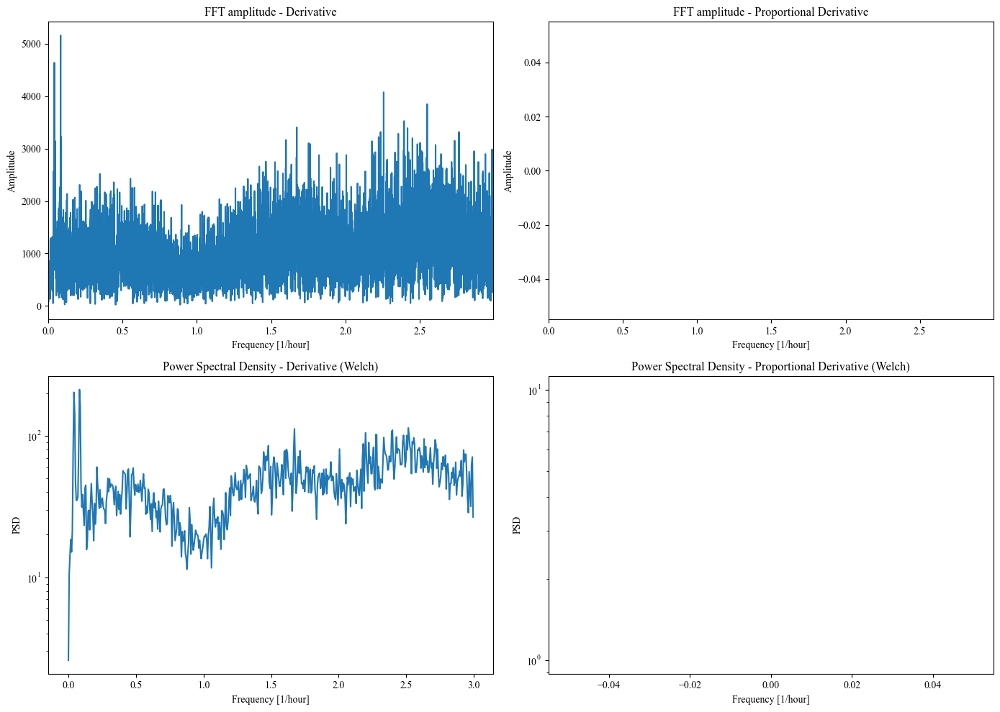

In [81]:
spec1 = plot_radon_spectral_analysis(RG1_2024_IA)

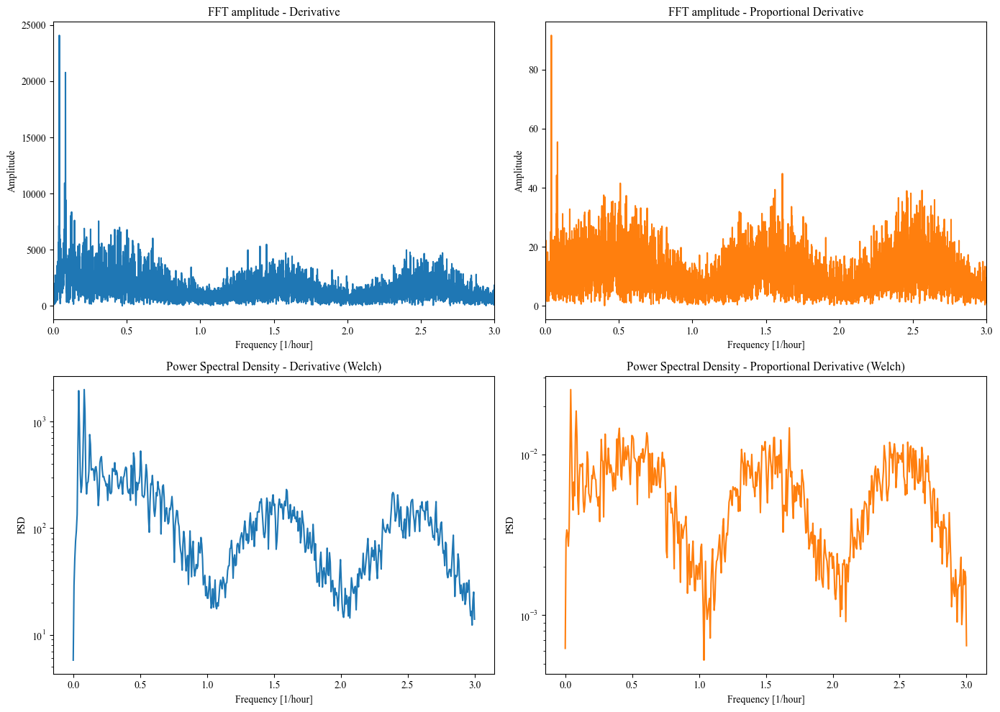

In [80]:
spec2 = plot_radon_spectral_analysis(RG2_2024_IA)

# 8. Feature correlation



Running pipeline for ../data/RG1.csv
Original y = 50.0 -> Scaled y = -0.32926327342571
Original y = 170.0 -> Scaled y = 1.31705309370284
Original y = 180.0 -> Scaled y = 1.4542461242968856
Original y = 190.0 -> Scaled y = 1.5914391548909315
Original y = 200.0 -> Scaled y = 1.7286321854849773
Original y = 400.0 -> Scaled y = 4.472492797365894
y_bin_train_seq: 21 transitions (0→1)
y_bin_train_seq: 20 transitions (1→0)
y_bin_val_seq: 10 transitions (0→1)
y_bin_val_seq: 10 transitions (1→0)
y_bin_test_seq: 10 transitions (0→1)
y_bin_test_seq: 9 transitions (1→0)


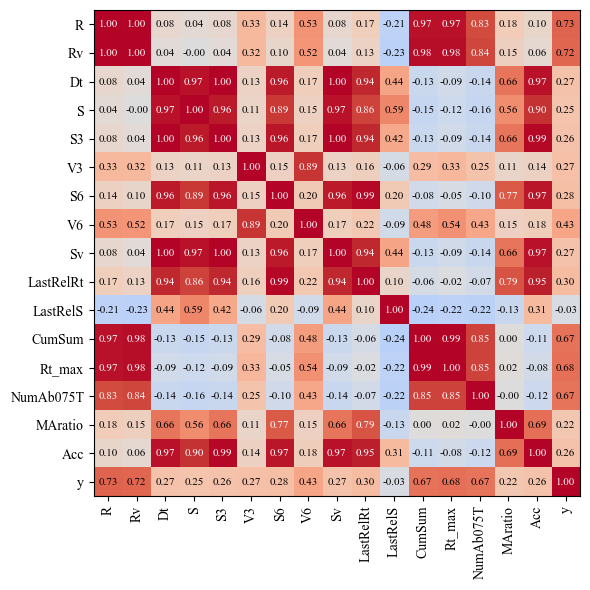



Running pipeline for ../data/RG2.csv
Original y = 75.0 -> Scaled y = -0.2154696132596685
Original y = 255.0 -> Scaled y = 0.7790055248618785
Original y = 270.0 -> Scaled y = 0.861878453038674
Original y = 285.0 -> Scaled y = 0.9447513812154696
Original y = 300.0 -> Scaled y = 1.0276243093922652
Original y = 600.0 -> Scaled y = 2.685082872928177
y_bin_train_seq: 50 transitions (0→1)
y_bin_train_seq: 50 transitions (1→0)
y_bin_val_seq: 23 transitions (0→1)
y_bin_val_seq: 23 transitions (1→0)
y_bin_test_seq: 6 transitions (0→1)
y_bin_test_seq: 7 transitions (1→0)


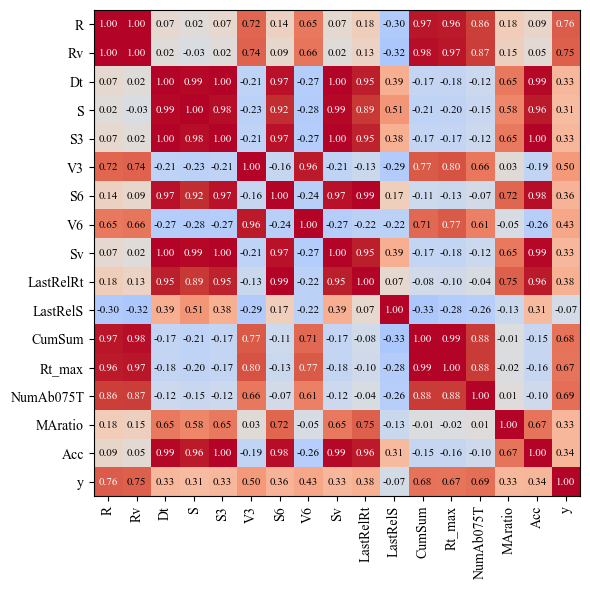

In [ ]:

for file in ["../data/RG1.csv", "../data/RG2.csv"]:
    print(f"\n\nRunning pipeline for {file}")
    

    threshold = 200 if "RG1" in file else 300

    (X_train, _, y_train_bin, _, _), \
    (X_val, _, y_val_bin, _, _), \
    (X_test, _, y_test_bin, _, _), \
    _, _, _ = preprocess_data(
        file, lookback=12, forecast=3, threshold=threshold,  numfeats=16
    )

    feature_names = ["R", "Rv", "Dt", "S", "S3", "V3", "S6", "V6", "Sv", "LastRelRt", 
                     "LastRelS", "CumSum", "Rt_max", "NumAb075T", "MAratio", "Acc"]
    # X_train es un tensor (B, T, F). Debes tenerlo ya cargado.
    B, T, F = X_train.shape

    # Lo paso a forma (B, F) promediando en el tiempo
    X_flat = X_train[:, :, :].mean(axis=1)

    # DataFrame con nombres reales
    df = pd.DataFrame(X_flat, columns=feature_names)
    df["y"] = y_train_bin

    # Matriz de correlación
    corr = df.corr()
    feature_names = ["R", "Rv", "Dt", "S", "S3", "V3", "S6", "V6", "Sv", "LastRelRt", 
                     "LastRelS", "CumSum", "Rt_max", "NumAb075T", "MAratio", "Acc", "y"]
    # --- PLOT ---
    plt.figure(figsize=(8, 6))
    plt.imshow(corr, cmap="coolwarm", vmin=-1, vmax=1)

    plt.xticks(range(len(feature_names)), feature_names, rotation=90)
    plt.yticks(range(len(feature_names)), feature_names)
    for i in range(len(feature_names)):
        for j in range(len(feature_names)):
            value = corr.iloc[i, j]
            plt.text(
                j, i,
                f"{value:.2f}",
                ha="center", va="center",
                color="black" if abs(value) < 0.75 else "white",
                fontsize=8
            )
    plt.tight_layout()
    plt.show()



Running pipeline for ../data/RG1.csv
Original y = 50.0 -> Scaled y = -0.32926327342571
Original y = 170.0 -> Scaled y = 1.31705309370284
Original y = 180.0 -> Scaled y = 1.4542461242968856
Original y = 190.0 -> Scaled y = 1.5914391548909315
Original y = 200.0 -> Scaled y = 1.7286321854849773
Original y = 400.0 -> Scaled y = 4.472492797365894
y_bin_train_seq: 21 transitions (0→1)
y_bin_train_seq: 20 transitions (1→0)
y_bin_val_seq: 10 transitions (0→1)
y_bin_val_seq: 10 transitions (1→0)
y_bin_test_seq: 10 transitions (0→1)
y_bin_test_seq: 9 transitions (1→0)
Selected 771 indices around transitions out of 6806 total


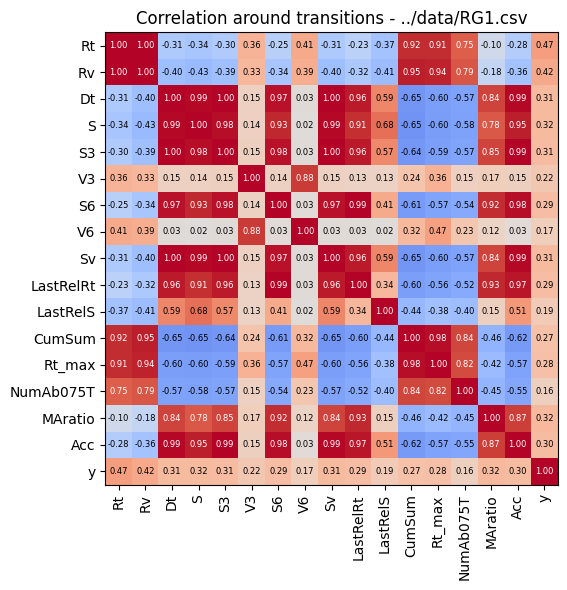



Running pipeline for ../data/RG2.csv
Original y = 75.0 -> Scaled y = -0.2154696132596685
Original y = 255.0 -> Scaled y = 0.7790055248618785
Original y = 270.0 -> Scaled y = 0.861878453038674
Original y = 285.0 -> Scaled y = 0.9447513812154696
Original y = 300.0 -> Scaled y = 1.0276243093922652
Original y = 600.0 -> Scaled y = 2.685082872928177
y_bin_train_seq: 50 transitions (0→1)
y_bin_train_seq: 50 transitions (1→0)
y_bin_val_seq: 23 transitions (0→1)
y_bin_val_seq: 23 transitions (1→0)
y_bin_test_seq: 6 transitions (0→1)
y_bin_test_seq: 7 transitions (1→0)
Selected 1751 indices around transitions out of 6822 total


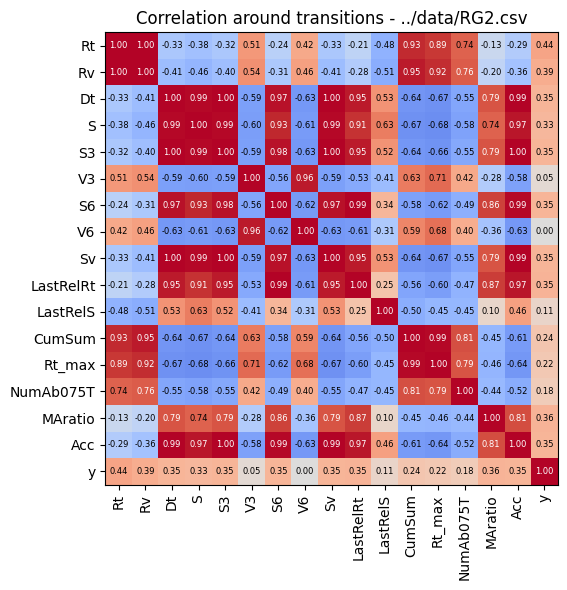

In [ ]:
window=12
for file in ["../data/RG1.csv", "../data/RG2.csv"]:
    print(f"\n\nRunning pipeline for {file}")
    
    threshold = 200 if "RG1" in file else 300

    (X_train, _, y_train_bin, _, _), \
    (X_val, _, y_val_bin, _, _), \
    (X_test, _, y_test_bin, _, _), \
    _, _, _ = preprocess_data(file, lookback=12, forecast=3, threshold=threshold)

    feature_names = ["Rt", "Rv", "Dt", "S", "S3", "V3", "S6", "V6", "Sv", 
                     "LastRelRt", "LastRelS", "CumSum", "Rt_max", 
                     "NumAb075T", "MAratio", "Acc"]

    B, T, F = X_train.shape
    X_flat = X_train[:, :, :].mean(axis=1)
    df = pd.DataFrame(X_flat, columns=feature_names)
    df["y"] = y_train_bin

    # --- detectar transiciones ---
    y_bin = y_train_bin
    transitions_idx = np.where(np.diff(y_bin) != 0)[0]  # índices donde y cambia
    selected_idx = []

    for idx in transitions_idx:
        # ventana antes y después
        start = max(0, idx - window)
        end = min(len(y_bin), idx + window + 1)
        selected_idx.extend(range(start, end))

    selected_idx = np.unique(selected_idx)
    print(f"Selected {len(selected_idx)} indices around transitions out of {len(y_bin)} total")

    # sub-dataframe con solo estos índices
    df_transitions = df.iloc[selected_idx]

    # matriz de correlación
    corr = df_transitions.corr()
    feature_names_all = feature_names + ["y"]
    
    plt.figure(figsize=(8, 6))
    plt.imshow(corr, cmap="coolwarm", vmin=-1, vmax=1)
    plt.xticks(range(len(feature_names_all)), feature_names_all, rotation=90)
    plt.yticks(range(len(feature_names_all)), feature_names_all)
    
    # mostrar valores
    for i in range(len(feature_names_all)):
        for j in range(len(feature_names_all)):
            value = corr.iloc[i, j]
            plt.text(
                j, i,
                f"{value:.2f}",
                ha="center", va="center",
                color="black" if abs(value) < 0.75 else "white",
                fontsize=6
            )

    plt.title(f"Correlation around transitions - {file}")
    plt.tight_layout()
    plt.show()

# 9. TS example

In [ ]:
def definitionlabels(y_pred_cl): 
    y_pred_cl = list(y_pred_cl)
    ybin = []

    # Initialize first label based on first value
    active = 1 if y_pred_cl[0] > 0.5 else 0
    ybin.append(active)

    for i in range(1, len(y_pred_cl)):
        val = y_pred_cl[i]

        if val >= 0.5:  # activate
            active = 1
        elif val < 0.35:  # deactivate
            active = 0
        # else: maintain previous state (active unchanged)

        ybin.append(active)

    return ybin

In [ ]:
model_args_a = {
    'input_size': 1,
    'hidden_size': 16,
    'num_layers': 2,
    'forecast_len': 6,
    'lookback': 12,
}

model1a = models.SerializableModule().create("DC", **model_args_a)
model1a.load_state_dict(
    torch.load("../models/checkpoints/radon_data/RG1DC_base/_base.pt",
               map_location='cpu'),
    strict=False
)

model2a = models.SerializableModule().create("DC", **model_args_a)
model2a.load_state_dict(
    torch.load("../models/checkpoints/radon_data/RG2DC_base/_base.pt",
               map_location='cpu'),
    strict=False
)

model1b = models.SerializableModule().create("R2C", **model_args_a)
model1b.load_state_dict(
    torch.load("../models/checkpoints/radon_data/RG1R2C_base/_base.pt",
               map_location='cpu'),
    strict=False
)

model2b = models.SerializableModule().create("R2C", **model_args_a)
model2b.load_state_dict(
    torch.load("../models/checkpoints/radon_data/RG2R2C_base/_base.pt",
               map_location='cpu'),
    strict=False
)

C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\3815953804.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load("../models/checkpoints/radon_data/RG1DC_base/_ba

_IncompatibleKeys(missing_keys=[], unexpected_keys=['total_ops', 'total_params'])

In [ ]:
(X_train, y_train, y_train_bin, w1, w2), (X_val, y_val, y_val_bin, w1, w2), (X_test, y_test, y_test_bin, w1, w2, ), scaler, scaler_y, train_std = preprocess_data(
    "../data/RG1.csv", testonly=True, lookback=12, forecast=6, threshold=200, 
)


_, _, test_loader = create_dataloaders(X_train, y_train, y_train_bin, w1, w2,  X_val, y_val, y_val_bin, w1, w2,  X_test, y_test, y_test_bin, w1, w2,
                                                               scaler=scaler, train_std=train_std, shuffle=False, batch_size=1)


Original y = 50.0 -> Scaled y = -0.32926327342571
Original y = 170.0 -> Scaled y = 1.31705309370284
Original y = 180.0 -> Scaled y = 1.4542461242968856
Original y = 190.0 -> Scaled y = 1.5914391548909315
Original y = 200.0 -> Scaled y = 1.7286321854849773
Original y = 400.0 -> Scaled y = 4.472492797365894
y_bin_train_seq: 0 transitions (0→1)
y_bin_train_seq: 0 transitions (1→0)
y_bin_val_seq: 0 transitions (0→1)
y_bin_val_seq: 0 transitions (1→0)
y_bin_test_seq: 34 transitions (0→1)
y_bin_test_seq: 33 transitions (1→0)


In [ ]:

model1a.eval()
test_preds_reg, test_preds_cl, test_targets_reg, test_targets_cl = [], [], [], []

with torch.no_grad():
    for X_test_batch, y_test_batch, y_batch_bin, w1, w2 in test_loader:
        X_test_batch = X_test_batch
        outputs_reg, outputs_cl = model1a(X_test_batch)
        test_preds_reg.append(outputs_reg.cpu())
        test_preds_cl.append(outputs_cl.cpu())
        test_targets_reg.append(y_test_batch.cpu())
        test_targets_cl.append(torch.tensor(y_batch_bin))

test_preds_reg = torch.cat(test_preds_reg).squeeze()
test_preds_cl = torch.cat(test_preds_cl).squeeze()
test_targets_reg = torch.cat(test_targets_reg).squeeze()
test_targets_cl = torch.cat(test_targets_cl).squeeze()

y_pred_reg = test_preds_reg.numpy()
y_pred_cl1a = torch.sigmoid(test_preds_cl).numpy()
#y_pred_bin1a = (y_pred_cl1a > 0.4).astype(int) #can be changed
y_pred_bin1a = definitionlabels(y_pred_cl1a)




C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\109606227.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_targets_cl.append(torch.tensor(y_batch_bin))


In [ ]:

model1b.eval()
test_preds_reg, test_preds_cl, test_targets_reg, test_targets_cl = [], [], [], []

with torch.no_grad():
    for X_test_batch, y_test_batch, y_batch_bin, w1, w2 in test_loader:
        X_test_batch = X_test_batch
        outputs_reg, outputs_cl = model1b(X_test_batch)
        test_preds_reg.append(outputs_reg.cpu())
        test_preds_cl.append(outputs_cl.cpu())
        test_targets_reg.append(y_test_batch.cpu())
        test_targets_cl.append(torch.tensor(y_batch_bin))
test_preds_reg = torch.cat(test_preds_reg).squeeze()
test_preds_cl = torch.cat(test_preds_cl).squeeze()
test_targets_reg = torch.cat(test_targets_reg).squeeze()
test_targets_cl = torch.cat(test_targets_cl).squeeze()

y_pred_reg = test_preds_reg.numpy()
y_pred_cl1b = torch.sigmoid(test_preds_cl).numpy()
y_pred_bin1b = definitionlabels(y_pred_cl1b)


C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2093416728.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_targets_cl.append(torch.tensor(y_batch_bin))


In [ ]:
(X_train, y_train, y_train_bin, w1, w2), (X_val, y_val, y_val_bin, w1, w2), (X_test, y_test, y_test_bin, w1, w2, ), scaler, scaler_y, train_std = preprocess_data("../data/RG2.csv", 
    testonly=True, lookback=12, forecast=6, threshold=200, 
)


_, _, test_loader = create_dataloaders(X_train, y_train, y_train_bin, w1, w2,  X_val, y_val, y_val_bin, w1, w2,  X_test, y_test, y_test_bin, w1, w2,
                                                               scaler=scaler, train_std=train_std, batch_size=1)


Original y = 50.0 -> Scaled y = -0.35359116022099446
Original y = 170.0 -> Scaled y = 0.30939226519337015
Original y = 180.0 -> Scaled y = 0.36464088397790057
Original y = 190.0 -> Scaled y = 0.4198895027624309
Original y = 200.0 -> Scaled y = 0.47513812154696133
Original y = 400.0 -> Scaled y = 1.580110497237569
y_bin_train_seq: 0 transitions (0→1)
y_bin_train_seq: 0 transitions (1→0)
y_bin_val_seq: 0 transitions (0→1)
y_bin_val_seq: 0 transitions (1→0)
y_bin_test_seq: 78 transitions (0→1)
y_bin_test_seq: 78 transitions (1→0)


In [ ]:

model2a.eval()
test_preds_reg, test_preds_cl, test_targets_reg, test_targets_cl = [], [], [], []

with torch.no_grad():
    for X_test_batch, y_test_batch, y_batch_bin, w1, w2 in test_loader:
        X_test_batch = X_test_batch
        outputs_reg, outputs_cl = model2a(X_test_batch)
        test_preds_reg.append(outputs_reg.cpu())
        test_preds_cl.append(outputs_cl.cpu())
        test_targets_reg.append(y_test_batch.cpu())
        test_targets_cl.append(torch.tensor(y_batch_bin))

test_preds_reg = torch.cat(test_preds_reg).squeeze()
test_preds_cl = torch.cat(test_preds_cl).squeeze()
test_targets_reg = torch.cat(test_targets_reg).squeeze()
test_targets_cl = torch.cat(test_targets_cl).squeeze()

y_pred_reg = test_preds_reg.numpy()
y_pred_cl2a = torch.sigmoid(test_preds_cl).numpy()
y_pred_bin2a = definitionlabels(y_pred_cl2a)



C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\3786603405.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_targets_cl.append(torch.tensor(y_batch_bin))


In [ ]:

model2b.eval()
test_preds_reg, test_preds_cl, test_targets_reg, test_targets_cl = [], [], [], []

with torch.no_grad():
    for X_test_batch, y_test_batch, y_batch_bin, w1, w2 in test_loader:
        X_test_batch = X_test_batch
        outputs_reg, outputs_cl = model2b(X_test_batch)
        test_preds_reg.append(outputs_reg.cpu())
        test_preds_cl.append(outputs_cl.cpu())
        test_targets_reg.append(y_test_batch.cpu())
        test_targets_cl.append(torch.tensor(y_batch_bin))

test_preds_reg = torch.cat(test_preds_reg).squeeze()
test_preds_cl = torch.cat(test_preds_cl).squeeze()
test_targets_reg = torch.cat(test_targets_reg).squeeze()
test_targets_cl = torch.cat(test_targets_cl).squeeze()

y_pred_reg = test_preds_reg.numpy()
y_pred_cl2b = torch.sigmoid(test_preds_cl).numpy()
y_pred_bin2b = definitionlabels(y_pred_cl2b)


C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\1961896545.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_targets_cl.append(torch.tensor(y_batch_bin))


In [ ]:
def compute_labels(data, radon_col='Radon', threshold=300):
    radon = data[radon_col].values
    Xt = np.zeros_like(radon)
    y_rs = np.zeros_like(radon, dtype=int)
    y_ia = np.zeros_like(radon, dtype=int)

    # --- Calcular Xt (EMA) ---
    for t in range(1, len(radon)):
        Xt[t] = 0.5 * radon[t] + 0.5 * Xt[t - 1]

    # --- Calcular y_rs ---
    for t in range(1, len(Xt)):
        slope = (Xt[t] - Xt[t - 1]) / 10
        if Xt[t] > threshold or (Xt[t] > (2/3*threshold) and slope > 0.3):
            y_rs[t] = 1
        elif Xt[t] < (2/3*threshold) or slope < -0.3:
            y_rs[t] = 0
        else:
            y_rs[t] = y_rs[t - 1]

    # --- Calcular y_ia (mirando hacia el futuro) ---
    for t in range(len(Xt) - 6):
        if radon[t + 6] > threshold*0.9:
            y_ia[t] = 1
        else:
            y_ia[t] = 0


    # --- Calcular Radon_diff ---
    radon_diff = radon - Xt

    # --- Añadir columnas ---
    data['Radon_raw'] = radon
    data['Radon_smooth'] = Xt
    data['Radon_diff'] = radon_diff
    data['Xt'] = Xt
    data['y_rs'] = y_rs
    data['y_ia'] = y_ia

    return data

In [ ]:
RG1_2024_IA = compute_labels(RG1_2024_IA, threshold=200)
RG2_2024_IA = compute_labels(RG2_2024_IA, threshold=300)

C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2536384925.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Radon_raw'] = radon
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2536384925.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Radon_smooth'] = Xt
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2536384925.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\1042984634.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Radon']] = imputer.fit_transform(df[['Radon']])
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\1042984634.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Radon']] = imputer.fit_transform(df[['Radon']])
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\1042984634.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

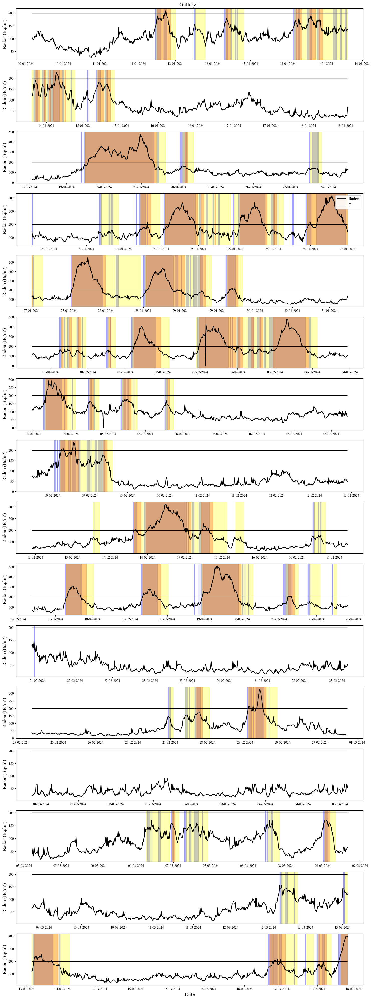

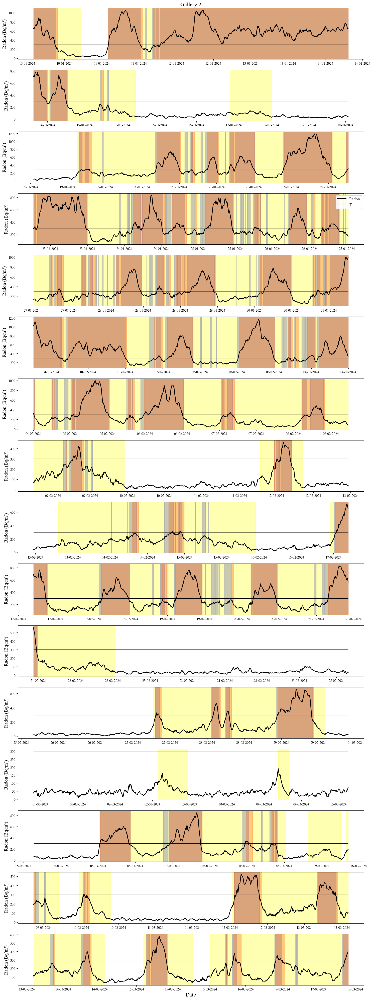

In [ ]:
plt.rcParams['font.family'] = 'Times New Roman'
lookback = 216

# --- Impute Radon ---
imputer = KNNImputer(n_neighbors=5)
for df in [RG1_2024_IA, RG2_2024_IA]:
    df[['Radon']] = imputer.fit_transform(df[['Radon']])

# --- Restore DateTime from timestamps ---
RG1_2024_IA['DateTime'] = pd.to_datetime(RG1_2024_IA['DateTime'], unit='s')
RG2_2024_IA['DateTime'] = pd.to_datetime(RG2_2024_IA['DateTime'], unit='s')

# --- Data setup ---
datasets = [RG1_2024_IA, RG2_2024_IA]
titles = ['Gallery 1', 'Gallery 2']
thresholds = [200, 300]


# --- Plot separately per gallery ---
for gallery_idx, (data, title, thr) in enumerate(zip(datasets, titles, thresholds)):
    
    # Assign prediction columns depending on gallery
    if gallery_idx == 0:   # Gallery 1
        preds = {
            "modelA": y_pred_bin1a,
            "modelB": y_pred_bin1b
        }
    else:                  # Gallery 2
        preds = {
            "modelA": y_pred_bin2a,
            "modelB": y_pred_bin2b
        }
    # Shift predictions backward by 12 positions
    data_shifted = data.iloc[12:-6].copy()
    for name, arr in preds.items():
        data_shifted[name] = arr  # arr must already have matching length

    # Now plot with the aligned dataframe
    fig, axes = plt.subplots(nrows=16, ncols=1, figsize=(15, 40), sharey=False)

    n = len(data_shifted)
    segments = [(i * n // 16, (i + 1) * n // 16) for i in range(16)]

    for seg_idx, (start, end) in enumerate(segments):
        ax = axes[seg_idx]
        segment = data_shifted.iloc[start:end]

        # Plot radon
        ax.plot(segment["DateTime"], segment["Radon"],
                color="k", linewidth=2, label="Radon")

        # Background coloring for y_rs + modelA + modelB
        bg_list = [
            ("y_rs", "blue", "Fan RS=1"),
            ("modelA", "red", "modelA = 1"),
            ("modelB", "yellow", "modelB = 1"),
        ]

        for col, color, label in bg_list:
            arr_seg = segment[col].values
            dates_seg = segment["DateTime"].values

            in_block = False
            block_start = None

            for i, val in enumerate(arr_seg):
                if val == 1 and not in_block:
                    in_block = True
                    block_start = dates_seg[i]
                elif val == 0 and in_block:
                    ax.axvspan(block_start, dates_seg[i],
                               color=color, alpha=0.3,
                               label=label if seg_idx == 0 else "")
                    in_block = False

            # Close final block if needed
            if in_block:
                ax.axvspan(block_start, dates_seg[-1],
                           color=color, alpha=0.3,
                           label=label if seg_idx == 0 else "")

        # Threshold lines
        ax.hlines(y=thr,
                  xmin=segment["DateTime"].min(),
                  xmax=segment["DateTime"].max(),
                  colors='k', linestyles='-', linewidth=1,
                  label=f'T')



        if seg_idx == 0:
            ax.set_title(title, fontsize=16)
        if seg_idx == 3:
            ax.legend(loc="upper right", framealpha=0.9, fontsize=12)

        ax.xaxis.set_major_formatter(mdates.DateFormatter("%d-%m-%Y"))
        ax.set_ylabel("Radon (Bq/m³)", fontsize=14)

    axes[-1].set_xlabel("Date", fontsize=16)
    plt.tight_layout()
    plt.show()

C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2670051191.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Radon']] = imputer.fit_transform(df[['Radon']])
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2670051191.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['Radon']] = imputer.fit_transform(df[['Radon']])
C:\Users\Lidia\AppData\Local\Temp\ipykernel_27096\2670051191.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_in

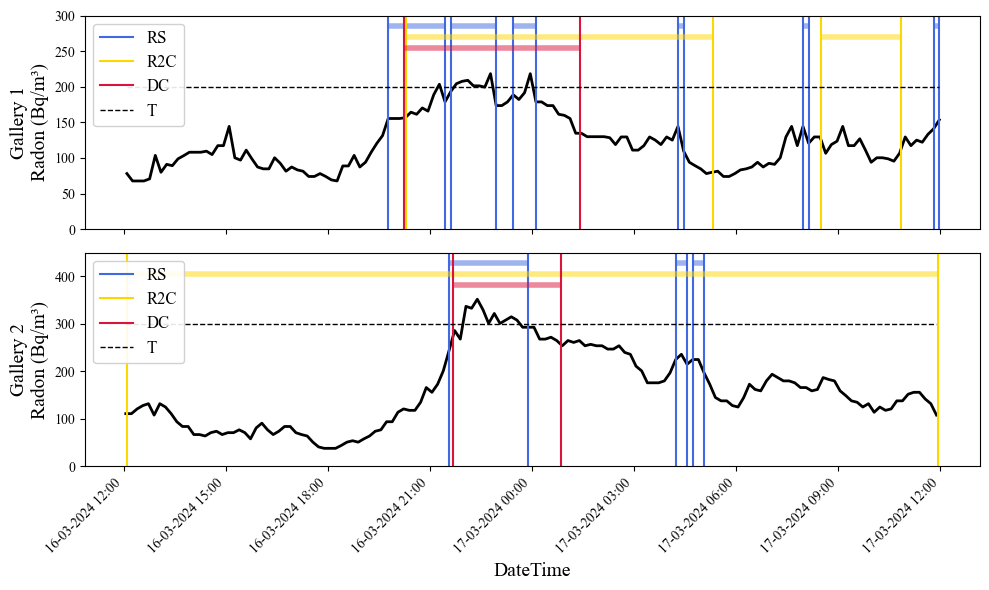

In [ ]:
plt.rcParams['font.family'] = 'Times New Roman'

# --- Impute Radon ---
imputer = KNNImputer(n_neighbors=5)
for df in [RG1_2024_IA, RG2_2024_IA]:
    df[['Radon']] = imputer.fit_transform(df[['Radon']])

# --- Restore DateTime from timestamps ---
RG1_2024_IA['DateTime'] = pd.to_datetime(RG1_2024_IA['DateTime'], unit='s')
RG2_2024_IA['DateTime'] = pd.to_datetime(RG2_2024_IA['DateTime'], unit='s')

# --- Data setup ---
datasets = [RG1_2024_IA, RG2_2024_IA]
titles = ['Gallery 1', 'Gallery 2']
thresholds = [200, 300]

# --- Zoom window ---
zoom_start = pd.Timestamp("2024-03-16 12:00", tz="UTC")  # mitad del 16 de marzo
zoom_end   = pd.Timestamp("2024-03-17 12:00", tz="UTC")  # final del 18 de marzo

# --- Create figure with 2 subplots sharing x-axis ---
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True)

for gallery_idx, (data, title, thr, ax) in enumerate(zip(datasets, titles, thresholds, axes)):
    
    # Assign predictions depending on gallery
    preds = {
        "modelA": y_pred_bin1a if gallery_idx == 0 else y_pred_bin2a,
        "modelB": y_pred_bin1b if gallery_idx == 0 else y_pred_bin2b
    }

    # Shift predictions if needed
    data_shifted = data[12:-6].copy()
    predA = pd.Series(preds["modelA"], index=data_shifted.index)
    predB = pd.Series(preds["modelB"], index=data_shifted.index)

    # Zoom window
    mask = (data_shifted["DateTime"] >= zoom_start) & (data_shifted["DateTime"] <= zoom_end)
    data_zoom = data_shifted.loc[mask].copy()
    data_zoom["modelA"] = predA.loc[mask]
    data_zoom["modelB"] = predB.loc[mask]

    # Plot Radon
    ax.plot(data_zoom["DateTime"], data_zoom["Radon"], color="k", linewidth=2)

    # Background coloring
    bg_list = [
        ("y_rs", "royalblue", "RS"),
        ("modelB", "gold", "R2C"),
        ("modelA", "crimson", "DC"),
    ]
    shown_labels = set()
    track_y_rel = {
        "y_rs": 0.95,    # RS → más alto
        "modelB": 0.90,  # R2C → aún más alto
        "modelA": 0.85,  # DC
    }

    # === Offsets para separar ligeramente las líneas si se superponen ===
    offsets = {
        "y_rs": pd.Timedelta(minutes=0),
        "modelB": pd.Timedelta(minutes=2),
        "modelA": pd.Timedelta(minutes=-2),
    }

    for col, color, label in bg_list:
        if col not in data_zoom.columns:
            continue

        arr_seg = data_zoom[col].values
        dates_seg = data_zoom["DateTime"].values

        in_block = False
        block_start = None

        # Altura absoluta para la línea horizontal de cada modelo

        track_height = track_y_rel[col] * 1.5*thr

        for i, val in enumerate(arr_seg):
            if val == 1 and not in_block:
                in_block = True
                block_start = dates_seg[i]

            elif val == 0 and in_block:
                start = block_start + offsets[col]
                end = dates_seg[i] + offsets[col]

                # Verticales
                ax.axvline(start, color=color, linewidth=1.5,
                        label=label if label not in shown_labels else "")
                shown_labels.add(label)
                ax.axvline(end, color=color, linewidth=1.5)

                # Horizontal duration line
                ax.hlines(track_height, xmin=start, xmax=end,
                        color=color, linewidth=4, alpha=0.5)
                in_block = False

        # --- Handle segment reaching the end of the zoom window ---
        if in_block:
            start = block_start + offsets[col]
            end = dates_seg[-1] + offsets[col]

            ax.axvline(start, color=color, linewidth=1.5,
                    label=label if label not in shown_labels else "")
            shown_labels.add(label)
            ax.axvline(end, color=color, linewidth=1.5)
            ax.hlines(track_height, xmin=start, xmax=end,
                    color=color, linewidth=4, alpha=0.5)


    # Threshold line
    ax.hlines(y=thr,
              xmin=data_zoom["DateTime"].min(),
              xmax=data_zoom["DateTime"].max(),
              colors='k', linestyles='--', linewidth=1,
              label='T')

    ax.set_ylabel(f"{title}\nRadon (Bq/m³)", fontsize=14)
    ax.set_ylim(0, 1.5*thr)
    
    ax.legend(loc="upper left", framealpha=0.9, fontsize=12)

# --- X-axis formatting ---
axes[-1].xaxis.set_major_formatter(mdates.DateFormatter("%d-%m-%Y %H:%M"))
plt.setp(axes[-1].xaxis.get_majorticklabels(), rotation=45, ha="right")
axes[-1].set_xlabel("DateTime", fontsize=14)


plt.tight_layout()
plt.show()
